**Odczytywanie tablic rejestracyjnych z samochodów**

https://www.kaggle.com/code/saworz/realtime-plate-reading-video-yolov5-easyocr/notebook

In [2]:
import pandas as pd
import numpy as np
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import glob
import seaborn as sns
from sklearn.model_selection import train_test_split
import time
import warnings
from sklearn.model_selection import train_test_split
warnings.filterwarnings('ignore')
import random
from ultralytics import YOLO
import easyocr
from codecarbon import EmissionsTracker

plt.rcParams['figure.figsize'] = (12, 8)
sns.set_style("whitegrid")

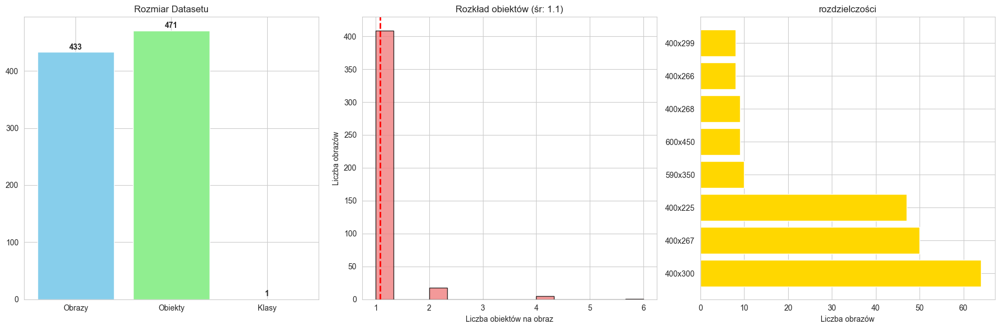

In [3]:
images_path = '/Users/franciszeklasinski/Desktop/projektml/archive-5/images'
annotations_path = '/Users/franciszeklasinski/Desktop/projektml/archive-5/annotations'

# Funkcja do parsowania pliku XML
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    
    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    
    objects = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        
        objects.append({
            'name': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })
    
    return {
        'filename': filename,
        'width': width,
        'height': height,
        'objects': objects
    }

annotations = []
xml_files = glob.glob(os.path.join(annotations_path, '*.xml'))

for xml_file in xml_files:
    try:
        data = parse_xml(xml_file)
        annotations.append(data)
    except:
        continue

df = pd.DataFrame(annotations)

# Analiza danych
all_objects = []
for _, row in df.iterrows():
    for obj in row['objects']:
        all_objects.append(obj['name'])

unique_classes = pd.Series(all_objects).unique()
objects_per_image = [len(row['objects']) for _, row in df.iterrows()]

# Wykresy 
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

#Rozmiar datasetu
categories = ['Obrazy', 'Obiekty', 'Klasy']
values = [len(df), len(all_objects), len(unique_classes)]
bars1 = ax1.bar(categories, values, color=['skyblue', 'lightgreen', 'orange'])
ax1.set_title('Rozmiar Datasetu')
for bar, val in zip(bars1, values):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(values)*0.01, 
             str(val), ha='center', fontweight='bold')

#Obiekty na obraz
ax2.hist(objects_per_image, bins=15, color='lightcoral', edgecolor='black', alpha=0.8)
ax2.set_xlabel('Liczba obiektów na obraz')
ax2.set_ylabel('Liczba obrazów')
ax2.set_title(f'Rozkład obiektów (śr: {np.mean(objects_per_image):.1f})')
ax2.axvline(np.mean(objects_per_image), color='red', linestyle='--', linewidth=2)

# Rozdzielczości obrazów
resolutions = df[['width', 'height']].value_counts().head(8)
res_labels = [f'{w}x{h}' for w, h in resolutions.index]
ax3.barh(range(len(res_labels)), resolutions.values, color='gold')
ax3.set_yticks(range(len(res_labels)))
ax3.set_yticklabels(res_labels)
ax3.set_xlabel('Liczba obrazów')
ax3.set_title('rozdzielczości')

plt.tight_layout()
plt.show()


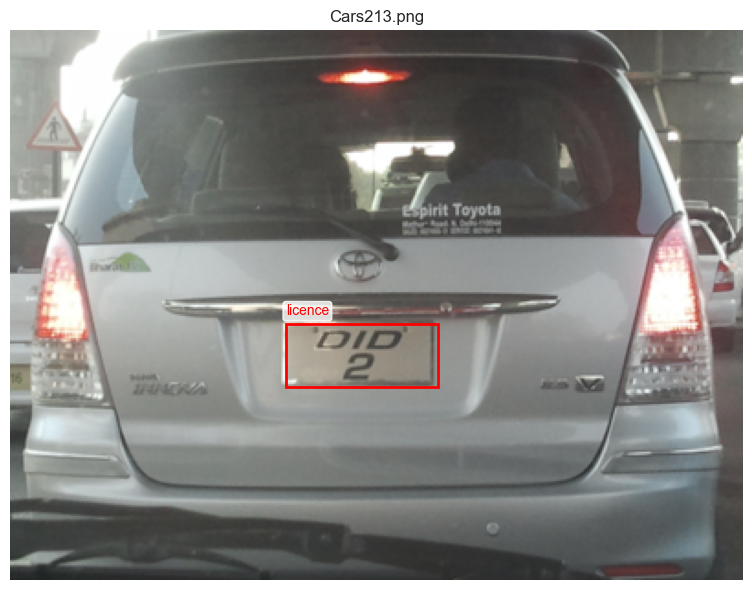

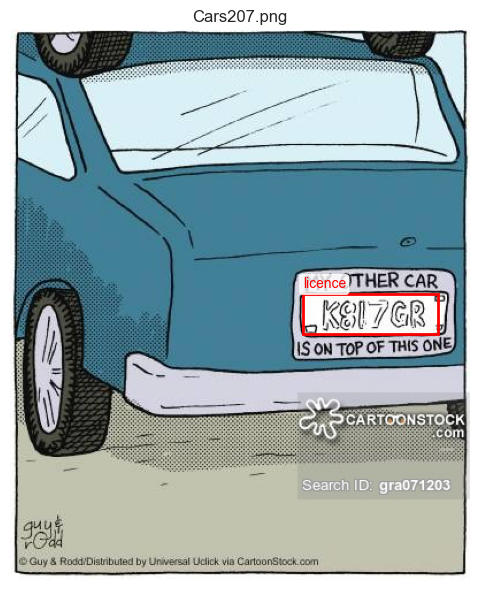

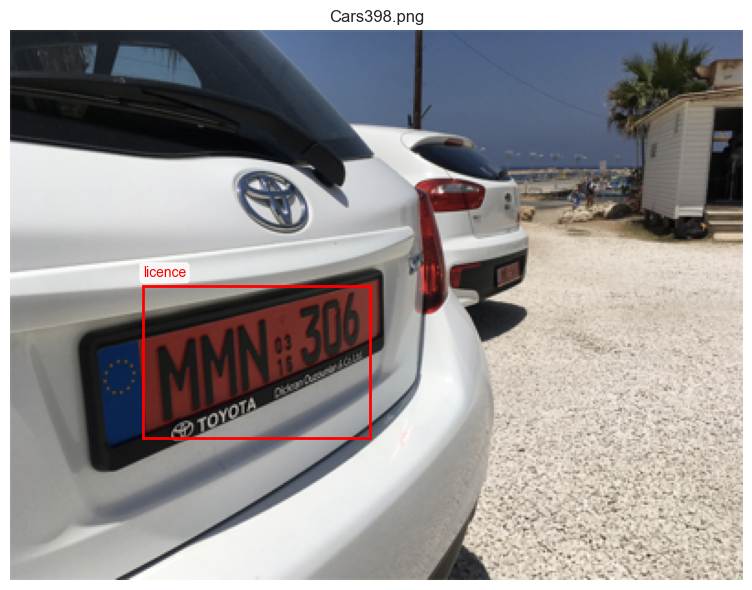

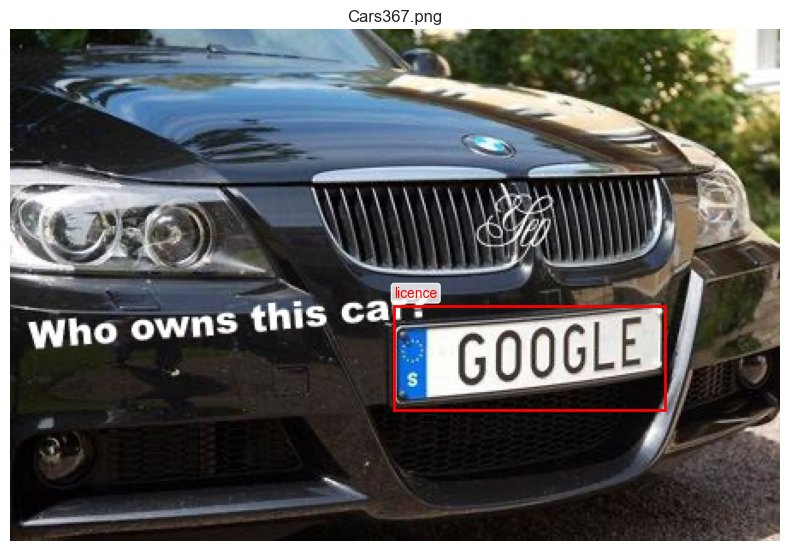

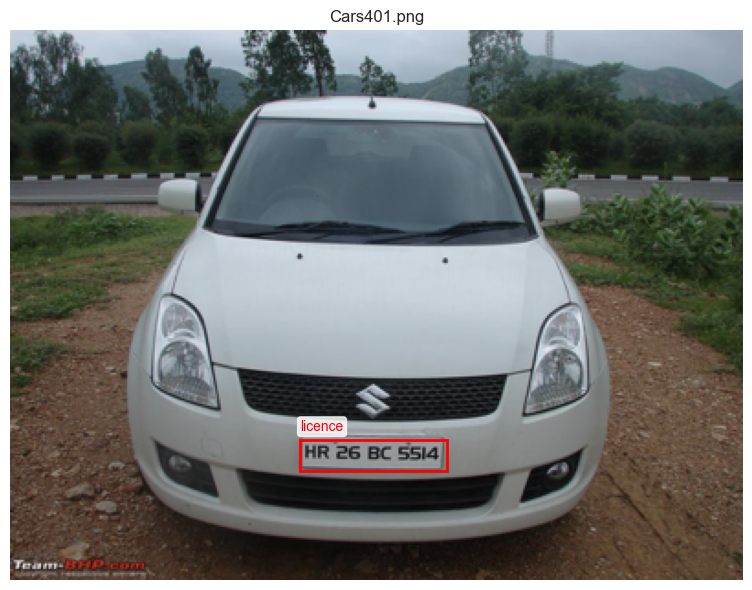

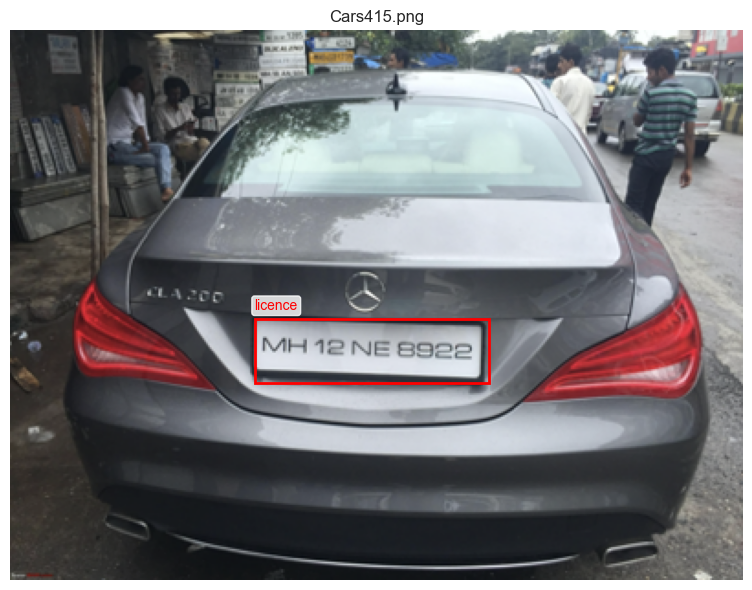

In [4]:
def display_image_with_boxes(image_data, images_path):
    filename = image_data['filename']
    image_path = os.path.join(images_path, filename)
    
    if not os.path.exists(image_path):
        return
    
    img = Image.open(image_path)
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    ax.imshow(img)
    
    for obj in image_data['objects']:
        xmin, ymin = obj['xmin'], obj['ymin']
        xmax, ymax = obj['xmax'], obj['ymax']
        width = xmax - xmin
        height = ymax - ymin
        
        rect = patches.Rectangle((xmin, ymin), width, height, 
                               linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        
        ax.text(xmin, ymin-5, obj['name'], color='red', fontsize=10, 
                bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))
    
    ax.set_title(filename)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

#przyklady
for i in range(min(6, len(df))):
    display_image_with_boxes(df.iloc[i], images_path)

In [5]:
# Przygotowanie danych YOLO
yolo_data_path = '/Users/franciszeklasinski/Desktop/projektml/yolo_dataset'
os.makedirs(f"{yolo_data_path}/images/train", exist_ok=True)
os.makedirs(f"{yolo_data_path}/images/val", exist_ok=True)
os.makedirs(f"{yolo_data_path}/labels/train", exist_ok=True)
os.makedirs(f"{yolo_data_path}/labels/val", exist_ok=True)

class_mapping = {class_name: idx for idx, class_name in enumerate(sorted(unique_classes))}
train_files, val_files = train_test_split(df.index.tolist(), test_size=0.2, random_state=42)

def convert_bbox_to_yolo(bbox, img_width, img_height):
    x_center = ((bbox['xmin'] + bbox['xmax']) / 2) / img_width
    y_center = ((bbox['ymin'] + bbox['ymax']) / 2) / img_height
    width = (bbox['xmax'] - bbox['xmin']) / img_width
    height = (bbox['ymax'] - bbox['ymin']) / img_height
    return x_center, y_center, width, height

def prepare_yolo_data(file_indices, split_name):
    prepared_count = 0
    for idx in file_indices:
        row = df.iloc[idx]
        image_filename = row['filename']
        
        src_image_path = os.path.join(images_path, image_filename)
        if not os.path.exists(src_image_path):
            continue
            
        dst_image_path = os.path.join(yolo_data_path, f'images/{split_name}', image_filename)
        if not os.path.exists(dst_image_path):
            import shutil
            shutil.copy2(src_image_path, dst_image_path)
        
        label_filename = image_filename.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(yolo_data_path, f'labels/{split_name}', label_filename)
        
        with open(label_path, 'w') as f:
            for obj in row['objects']:
                class_id = class_mapping[obj['name']]
                x_center, y_center, width, height = convert_bbox_to_yolo(obj, row['width'], row['height'])
                f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")
        
        prepared_count += 1
    return prepared_count

train_count = prepare_yolo_data(train_files, 'train')
val_count = prepare_yolo_data(val_files, 'val')
yaml_content = f"""path: {yolo_data_path}
train: images/train
val: images/val
nc: {len(class_mapping)}
names: {list(class_mapping.keys())}
"""

with open(f"{yolo_data_path}/data.yaml", 'w') as f:
    f.write(yaml_content)

print(f"Dataset: {train_count} train, {val_count} val")
print(f"Klasy: {list(class_mapping.keys())}")

Dataset: 346 train, 87 val
Klasy: ['licence']


In [ ]:
#MPS  
import torch
if torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'

# Inicjalizacja trackera emisji
tracker = EmissionsTracker(project_name="yolo_car_detection", output_dir="./emissions")
tracker.start()

# Trening modelu YOLOv8
model = YOLO("yolov8s.pt")  

model.train(
    data=f"{yolo_data_path}/data.yaml",
    epochs=20, 
    batch=8, 
    imgsz=640,
    device=device,
    project="car_detection",
    name="yolov8s_cars",
    workers=4,
    augment=True, 
    verbose=True,
    val=True
)

# Zatrzymanie trackera i wyświetlenie wyników
emissions = tracker.stop()
print(f"\n🌍 Emisje CO2: {emissions:.6f} kg")
print(f"📊 Raport zapisany w: ./emissions/")

Ultralytics 8.3.205 🚀 Python-3.9.6 torch-2.7.1 CPU (Apple M4)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1033.1±346.3 MB/s, size: 437.2 KB)
val: Scanning /Users/franciszeklasinski/Desktop/projektml/yolo_dataset/labels/val.cache... 87 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 87/87 318.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 0.2it/s 25.8s6.1ss
                   all         87         90      0.902      0.867      0.928      0.612
Speed: 0.6ms preprocess, 283.0ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /Users/franciszeklasinski/Desktop/projektml/runs/detect/val4


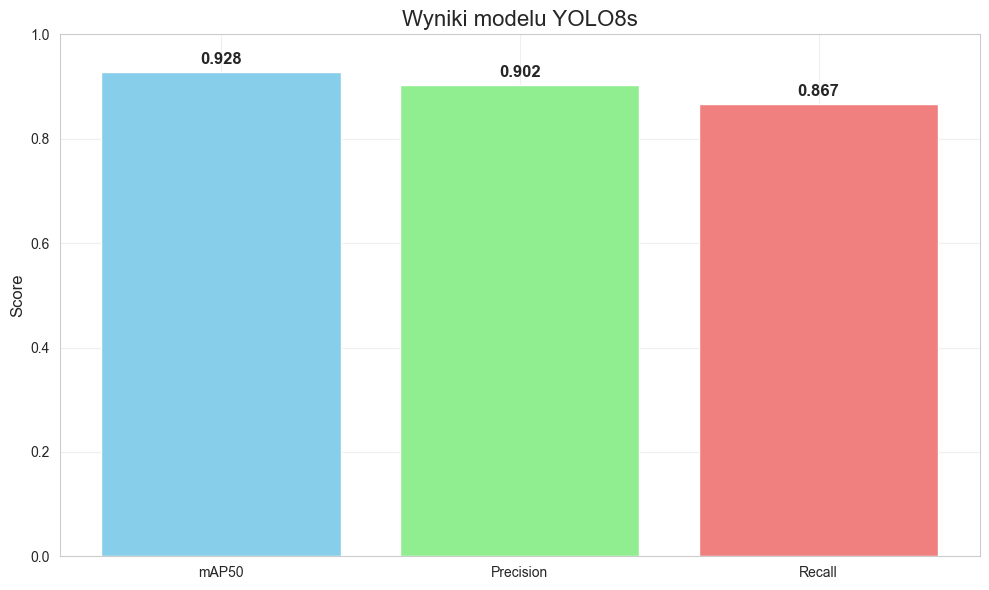

In [6]:
# Wyniki modelu 
results = model.val()

# Wykres metryk
metrics = ['mAP50', 'Precision', 'Recall']
values = [results.box.map50, results.box.mp, results.box.mr]

plt.figure(figsize=(10, 6))
bars = plt.bar(metrics, values, color=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Wyniki modelu YOLO8s', fontsize=16)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)

for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{value:.3f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Using CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

[codecarbon WARNING @ 12:58:30] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon WARNING @ 12:58:30] Error while trying to count physical CPUs: [Errno 2] No such file or directory: 'lscpu'. Defaulting to 1.
[codecarbon INFO @ 12:58:30] [setup] RAM Tracking...
[codecarbon INFO @ 12:58:30] [setup] CPU Tracking...
[codecarbon WARNING @ 12:58:30] We saw that you have a Apple M4 but we don't know it. Please contact us.
[codecarbon WARNING @ 12:58:30] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Mac OS detected: Please install Intel Power Gadget or enable PowerMetrics sudo to measure CPU

[codecarbon INFO @ 12:58:30] CPU Model on constant consumption mode: Apple M4
[codecarbon WARNING @ 12:58:30] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 12:58:30] [setup] GPU Tracking...
[codecarbon INFO @ 12:58:30] No GPU found.
[codecarbon INFO @ 12:58:30] The below tracking methods have been set up:



image 1/1 /Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars371.png: 320x640 1 licence, 58.4ms
Speed: 1.8ms preprocess, 58.4ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 640)


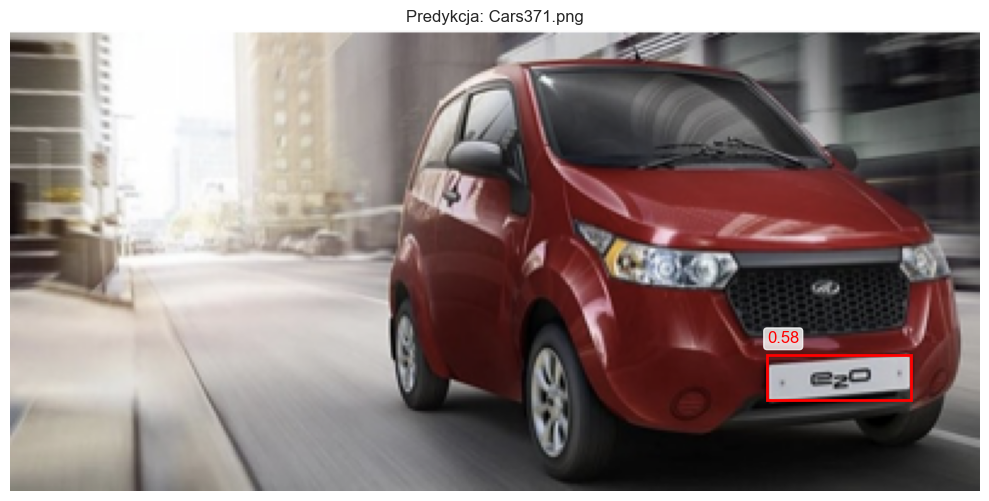


image 1/1 /Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars370.png: 448x640 1 licence, 59.4ms
Speed: 1.0ms preprocess, 59.4ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)


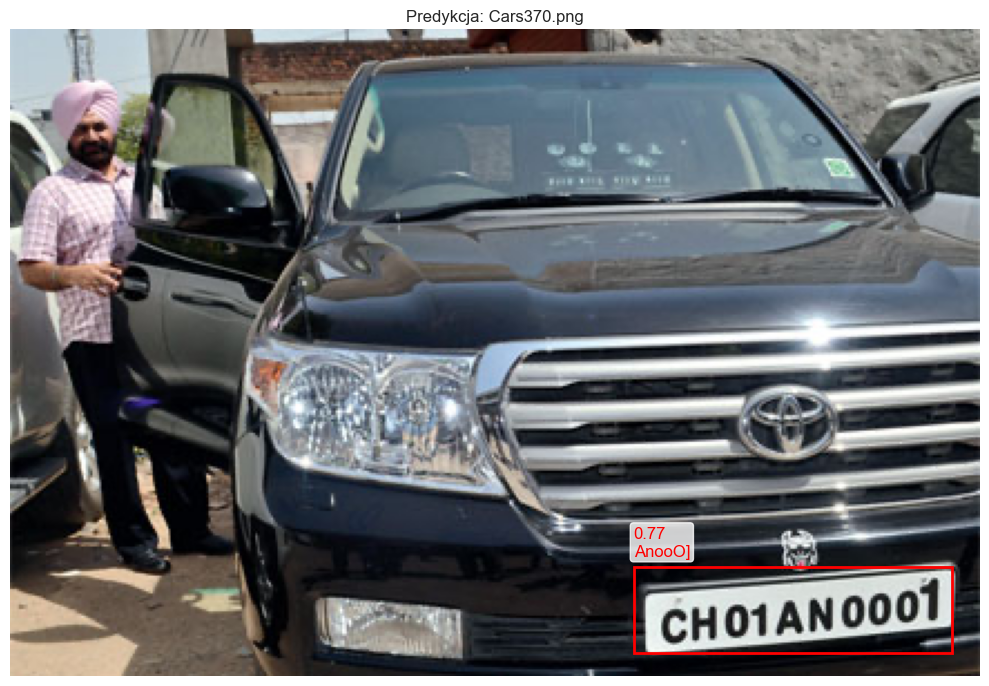


image 1/1 /Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars125.png: 416x640 1 licence, 71.9ms
Speed: 0.8ms preprocess, 71.9ms inference, 0.3ms postprocess per image at shape (1, 3, 416, 640)


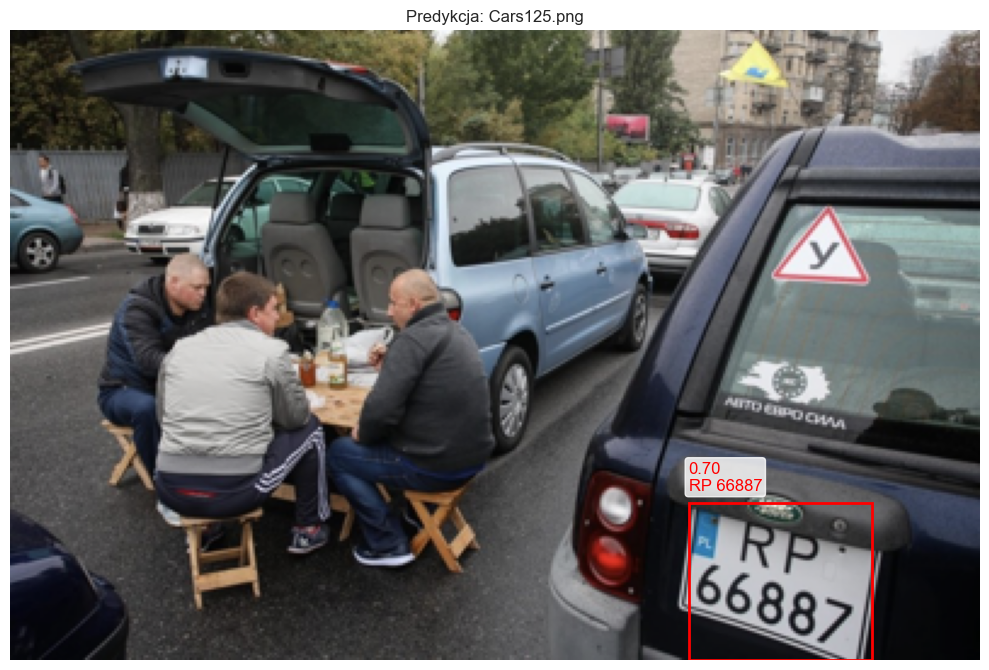


image 1/1 /Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars164.png: 448x640 1 licence, 57.3ms
Speed: 2.1ms preprocess, 57.3ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


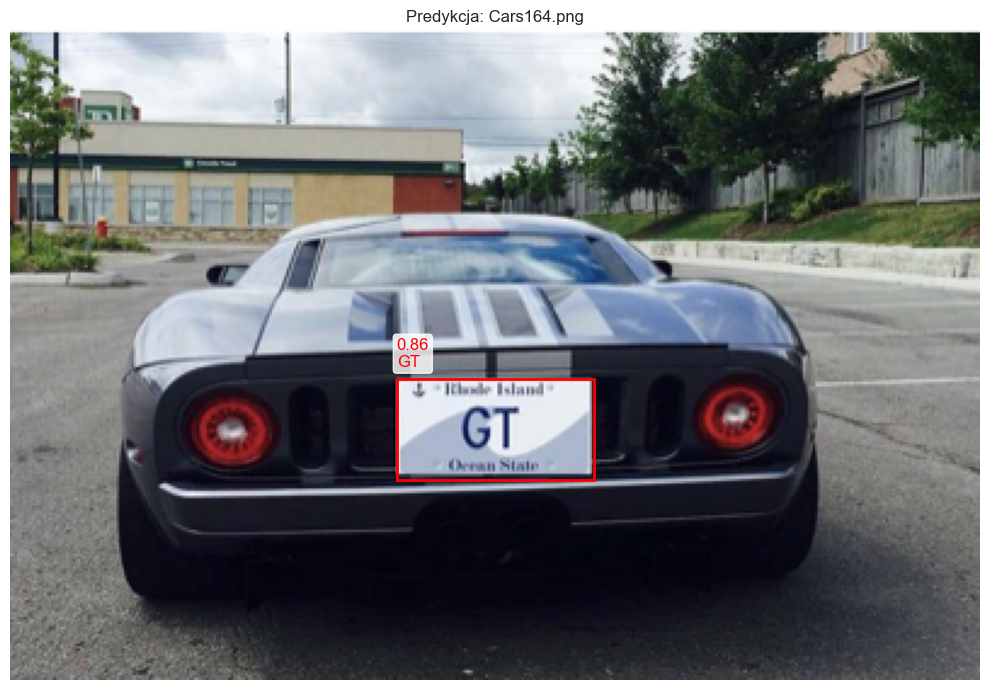


image 1/1 /Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars177.png: 384x640 1 licence, 59.6ms
Speed: 4.0ms preprocess, 59.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


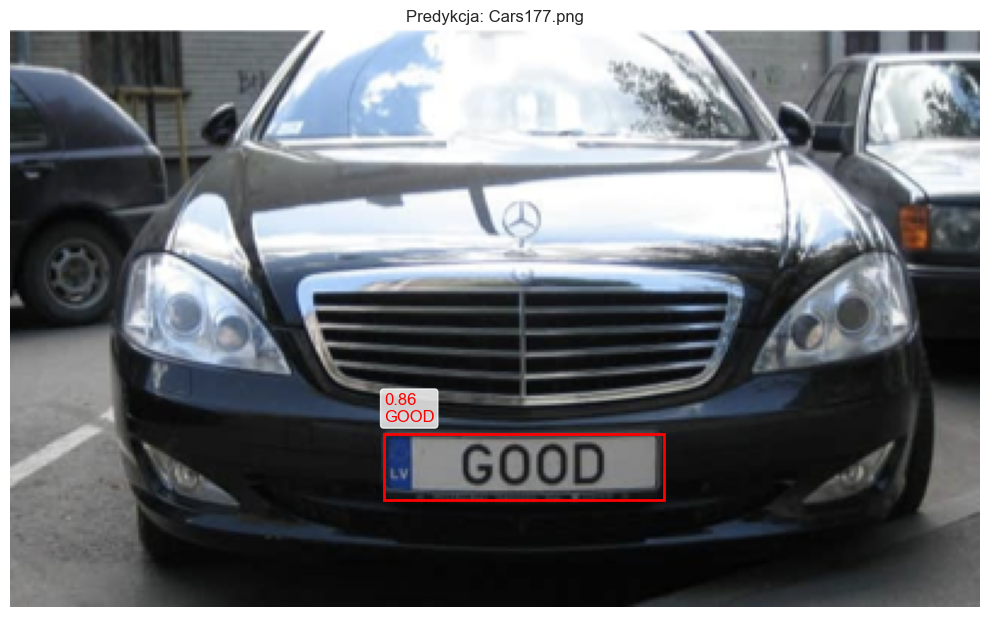

[codecarbon INFO @ 12:58:33] Energy consumed for RAM : 0.000001 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 12:58:33] Delta energy consumed for CPU with constant : 0.000012 kWh, power : 42.5 W
[codecarbon INFO @ 12:58:33] Energy consumed for All CPU : 0.000012 kWh
[codecarbon INFO @ 12:58:33] 0.000013 kWh of electricity used since the beginning.



🌍 Emisje CO2 (predykcja): 0.000009 kg


In [7]:
# Inicjalizacja EasyOCR (obsługuje polskie tablice rejestracyjne)
reader = easyocr.Reader(['en'], gpu=False)  # 'en' dla angielskich znaków, możesz dodać 'pl' dla polskiego

# Tracker dla predykcji
prediction_tracker = EmissionsTracker(project_name="yolo_prediction", output_dir="./emissions")
prediction_tracker.start()

# Test na losowych zdjęciach z validation
test_images = random.sample(val_files, 5)

for idx in test_images:
    image_path = os.path.join(images_path, df.iloc[idx]['filename'])
    results = model.predict(image_path, conf=0.5)
    img = Image.open(image_path)
    img_array = np.array(img)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.imshow(img)
    
    if results[0].boxes is not None:
        boxes = results[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            
            # Ramka
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            
            # Wycięcie regionu z tablicą rejestracyjną
            x1_int, y1_int, x2_int, y2_int = int(x1), int(y1), int(x2), int(y2)
            plate_region = img_array[y1_int:y2_int, x1_int:x2_int]
            
            # OCR na wyciętym regionie
            plate_text = ""
            if plate_region.size > 0:
                try:
                    ocr_results = reader.readtext(plate_region)
                    if ocr_results:
                        # Pobierz tekst z najwyższym confidence
                        plate_text = ' '.join([text for (bbox, text, prob) in ocr_results if prob > 0.5])
                except:
                    plate_text = ""
            
            # Tekst z pewnością i odczytanym tekstem
            label = f'{conf:.2f}'
            if plate_text:
                label += f'\n{plate_text}'
                
            ax.text(x1, y1-5, label, color='red', fontsize=12, 
                    bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))
    
    ax.set_title(f'Predykcja: {df.iloc[idx]["filename"]}')
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# Zatrzymanie trackera predykcji
prediction_emissions = prediction_tracker.stop()
print(f"\n🌍 Emisje CO2 (predykcja): {prediction_emissions:.6f} kg")

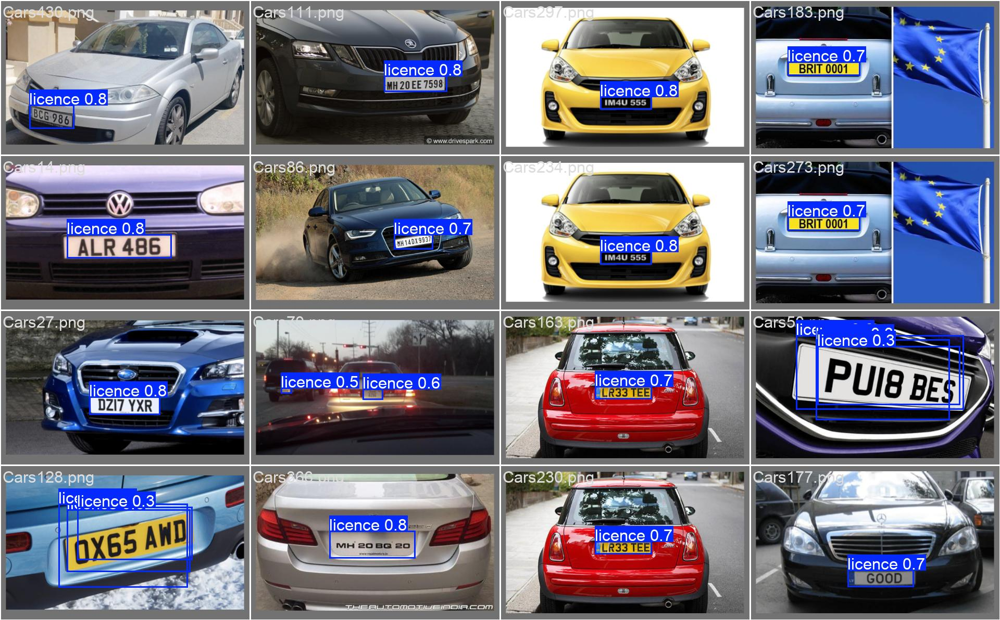

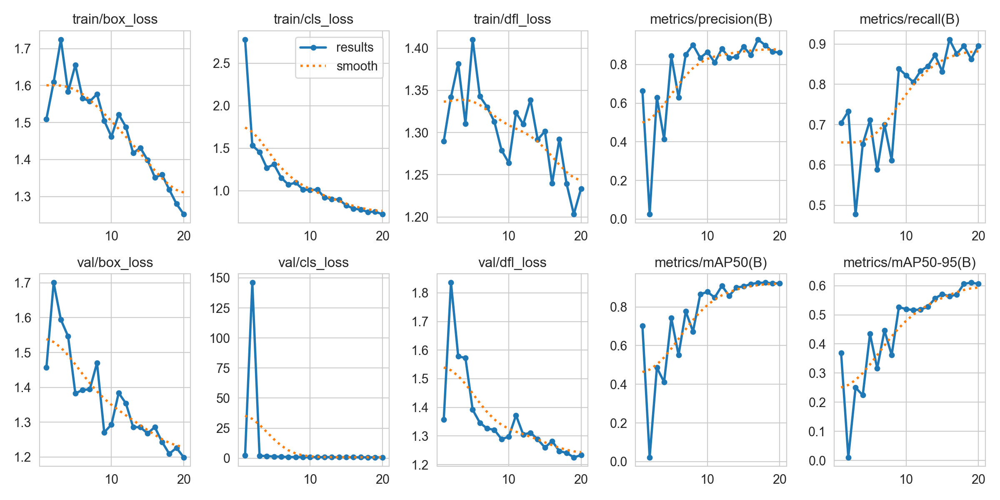

## 🚀 Rozszerzenia modelu

### 1. **OCR (Optical Character Recognition) - EasyOCR**
- Automatyczne odczytywanie tekstu z tablic rejestracyjnych
- Wyświetlanie odczytanych numerów bezpośrednio na obrazach
- Filtrowanie wyników według poziomu pewności (confidence > 0.5)

### 2. **CodeCarbon - Green AI Tracking**
- Monitorowanie emisji CO2 podczas treningu i predykcji
- Pomiar zużycia energii w kWh
- Generowanie szczegółowych raportów ekologicznych
- Wizualizacja wpływu środowiskowego modelu

**Korzyści:**
- ✅ Pełna funkcjonalność odczytu tablic rejestracyjnych
- ✅ Świadomość kosztów środowiskowych AI
- ✅ Zgodność z zasadami Green AI i zrównoważonego rozwoju

🌍 RAPORT EMISJI CO2 - GREEN AI

📊 Projekt: yolo_car_detection
⚡ Zużycie energii: 0.037407 kWh
🌱 Emisje CO2: 0.024761 kg CO2eq
⏱️  Czas trwania: 2960.21 sekund
🔌 Źródło energii: Poland

📊 Projekt: yolo_prediction
⚡ Zużycie energii: 0.000013 kWh
🌱 Emisje CO2: 0.000009 kg CO2eq
⏱️  Czas trwania: 1.05 sekund
🔌 Źródło energii: Poland


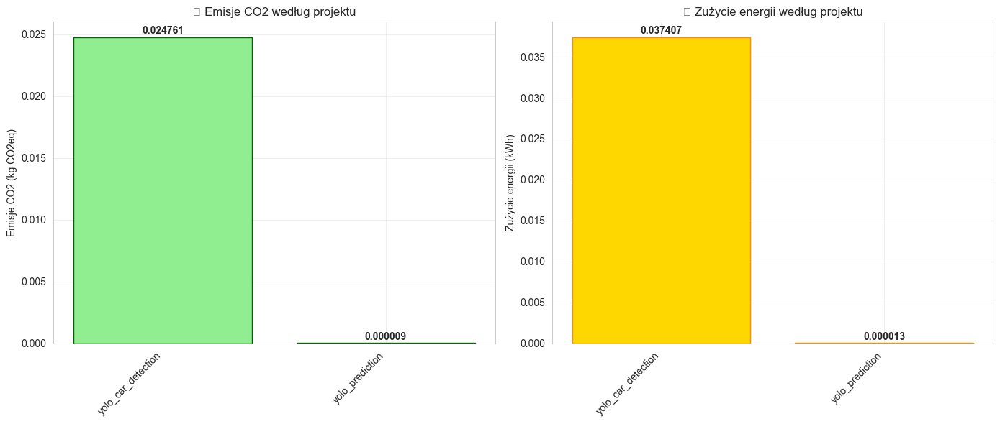


🌳 EKWIWALENTY EMISJI
🚗 Przejechane km samochodem: 0.12 km
🌲 Drzew potrzebnych do pochłonięcia: 1.24
💡 Godzin pracy żarówki LED (10W): 24.77 h


In [8]:
# Wizualizacja emisji CO2 i raportu GreenAI
import json

# Odczyt raportów emisji
emissions_files = glob.glob('./emissions/emissions*.csv')

if emissions_files:
    # Wczytanie najnowszego raportu
    emissions_df = pd.read_csv(emissions_files[-1])
    
    print("=" * 60)
    print("🌍 RAPORT EMISJI CO2 - GREEN AI")
    print("=" * 60)
    
    for idx, row in emissions_df.iterrows():
        print(f"\n📊 Projekt: {row['project_name']}")
        print(f"⚡ Zużycie energii: {row['energy_consumed']:.6f} kWh")
        print(f"🌱 Emisje CO2: {row['emissions']:.6f} kg CO2eq")
        print(f"⏱️  Czas trwania: {row['duration']:.2f} sekund")
        print(f"🔌 Źródło energii: {row.get('country_name', 'N/A')}")
    
    # Wykres porównawczy
    if len(emissions_df) > 0:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
        
        # Emisje CO2 per projekt
        projects = emissions_df['project_name']
        emissions = emissions_df['emissions']
        
        bars1 = ax1.bar(range(len(projects)), emissions, color='lightgreen', edgecolor='darkgreen')
        ax1.set_xticks(range(len(projects)))
        ax1.set_xticklabels(projects, rotation=45, ha='right')
        ax1.set_ylabel('Emisje CO2 (kg CO2eq)')
        ax1.set_title('🌍 Emisje CO2 według projektu')
        ax1.grid(True, alpha=0.3)
        
        for i, (bar, val) in enumerate(zip(bars1, emissions)):
            ax1.text(i, val + max(emissions)*0.01, f'{val:.6f}', 
                    ha='center', fontsize=10, fontweight='bold')
        
        # Zużycie energii
        energy = emissions_df['energy_consumed']
        bars2 = ax2.bar(range(len(projects)), energy, color='gold', edgecolor='darkorange')
        ax2.set_xticks(range(len(projects)))
        ax2.set_xticklabels(projects, rotation=45, ha='right')
        ax2.set_ylabel('Zużycie energii (kWh)')
        ax2.set_title('⚡ Zużycie energii według projektu')
        ax2.grid(True, alpha=0.3)
        
        for i, (bar, val) in enumerate(zip(bars2, energy)):
            ax2.text(i, val + max(energy)*0.01, f'{val:.6f}', 
                    ha='center', fontsize=10, fontweight='bold')
        
        plt.tight_layout()
        plt.show()
        
        # Ekwiwalenty emisji
        total_emissions = emissions_df['emissions'].sum()
        print("\n" + "=" * 60)
        print("🌳 EKWIWALENTY EMISJI")
        print("=" * 60)
        print(f"🚗 Przejechane km samochodem: {total_emissions * 5:.2f} km")
        print(f"🌲 Drzew potrzebnych do pochłonięcia: {total_emissions * 50:.2f}")
        print(f"💡 Godzin pracy żarówki LED (10W): {total_emissions * 1000:.2f} h")
        print("=" * 60)
else:
    print("❌ Nie znaleziono raportów emisji. Uruchom najpierw komórki z treningiem lub predykcją.")

In [9]:
from PIL import Image, ImageDraw
import cv2
from IPython.display import Video
import os

In [ ]:
# Inferencja z użyciem video (10sek MAX) + OCR z ulepszonym preprocessingiem
video_path = "/Users/franciszeklasinski/Desktop/projektml/IMG_6648.MOV" 
output_dir = "videos/outputcar"
reader = easyocr.Reader(['en'], gpu=False)  # 'en' dla angielskich znaków, możesz dodać 'pl' dla polskiego
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "output_videocarocr.mp4")

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # format mp4
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

print(f"Wideo do zapisu: {output_path}, {width}x{height}, {fps} FPS")

# Predykcja klatka po klatce z OCR

frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Łączna liczba klatek: {frame_count}")

frame_num = 0
ocr_detected_count = 0  # Licznik wykrytych tablic

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame_num += 1
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = model.predict(frame_rgb, conf=0.3, stream=False)

    # Rysowanie ramek i OCR
    annotated_frame = frame_rgb.copy()
    
    if results[0].boxes is not None:
        boxes = results[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            
            # Konwersja do int
            x1_int, y1_int, x2_int, y2_int = int(x1), int(y1), int(x2), int(y2)
            
            # Rysowanie ramki
            cv2.rectangle(annotated_frame, (x1_int, y1_int), (x2_int, y2_int), (255, 0, 0), 3)
            
            # Wycięcie regionu z tablicą rejestracyjną
            plate_region = frame_rgb[y1_int:y2_int, x1_int:x2_int]
            
            # OCR na wyciętym regionie z zaawansowanym preprocessingiem
            plate_text = ""
            if plate_region.size > 0 and plate_region.shape[0] > 15 and plate_region.shape[1] > 15:
                try:
                    # Preprocessing - AGRESYWNIEJSZE PODEJŚCIE
                    plate_gray = cv2.cvtColor(plate_region, cv2.COLOR_RGB2GRAY)
                    
                    # Zwiększenie rozmiaru 4x dla jeszcze lepszego rozpoznania
                    plate_resized = cv2.resize(plate_gray, None, fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
                    
                    # METODA 1: Oryginał po prostu zwiększony (często najlepsze)
                    ocr_results = reader.readtext(plate_resized, detail=1, paragraph=False)
                    if ocr_results:
                        # BARDZO NISKI PRÓG - zbieramy wszystko
                        texts = [text.upper() for (bbox, text, prob) in ocr_results if prob > 0.01]
                        if texts:
                            plate_text = ' '.join(texts)
                    
                    # METODA 2: Z kontrastem
                    if not plate_text:
                        plate_contrast = cv2.equalizeHist(plate_resized)
                        ocr_results = reader.readtext(plate_contrast, detail=1, paragraph=False)
                        if ocr_results:
                            texts = [text.upper() for (bbox, text, prob) in ocr_results if prob > 0.01]
                            if texts:
                                plate_text = ' '.join(texts)
                    
                    # METODA 3: Binaryzacja
                    if not plate_text:
                        plate_contrast = cv2.equalizeHist(plate_resized)
                        _, plate_binary = cv2.threshold(plate_contrast, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
                        ocr_results = reader.readtext(plate_binary, detail=1, paragraph=False)
                        if ocr_results:
                            texts = [text.upper() for (bbox, text, prob) in ocr_results if prob > 0.01]
                            if texts:
                                plate_text = ' '.join(texts)
                    
                    # METODA 4: Odwrócona binaryzacja (białe litery na czarnym)
                    if not plate_text:
                        plate_contrast = cv2.equalizeHist(plate_resized)
                        _, plate_binary_inv = cv2.threshold(plate_contrast, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
                        ocr_results = reader.readtext(plate_binary_inv, detail=1, paragraph=False)
                        if ocr_results:
                            texts = [text.upper() for (bbox, text, prob) in ocr_results if prob > 0.01]
                            if texts:
                                plate_text = ' '.join(texts)
                    
                    # Czyszczenie tekstu - usuń dziwne znaki
                    if plate_text:
                        # Usuń zbyt krótkie "słowa" (pojedyncze znaki szumu)
                        words = plate_text.split()
                        words = [w for w in words if len(w) >= 2 or w.isalnum()]
                        plate_text = ' '.join(words)
                        
                        if plate_text:
                            ocr_detected_count += 1
                        
                except Exception as e:
                    plate_text = f"ERR: {str(e)[:20]}"  # Debug: pokaż błąd
            
            # Tekst z pewnością i odczytanym tekstem
            label = f'Conf: {conf:.2f}'
            if plate_text:
                label = f'{plate_text}'  # Pokazuj głównie tekst tablicy
            
            # Tło dla tekstu (białe tło dla lepszej czytelności)
            label_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)
            label_width, label_height = label_size
            
            # Rysowanie białego tła pod tekstem
            cv2.rectangle(annotated_frame, 
                         (x1_int, y1_int - label_height - 15), 
                         (x1_int + label_width + 10, y1_int - 5), 
                         (255, 255, 255), -1)
            
            # Dodanie tekstu na obrazie (czarny tekst na białym tle)
            cv2.putText(annotated_frame, label, (x1_int + 5, y1_int - 10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 2, cv2.LINE_AA)
            
            # Dodaj conf score w rogu ramki (małym tekstem)
            cv2.putText(annotated_frame, f'{conf:.2f}', (x1_int + 5, y1_int + 20), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2, cv2.LINE_AA)
    
    # Konwersja z powrotem do BGR dla zapisu
    annotated_frame_bgr = cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR)
    out.write(annotated_frame_bgr)
    
    if frame_num % 30 == 0:
        print(f"Przetworzone klatki: {frame_num}/{frame_count} | Wykryte tablice OCR: {ocr_detected_count}")

cap.release()
out.release()
print(f"\n✅ Wideo zapisane: {output_path}")
print(f"📹 Przetworzone klatki: {frame_num}")
print(f"🔤 Wykryte tablice rejestracyjne (OCR): {ocr_detected_count}")

Using CPU. Note: This module is much faster with a GPU.


Wideo do zapisu: videos/outputcar/output_videocarocr.mp4, 2160x3840, 30.005619029780856 FPS
Łączna liczba klatek: 267

0: 640x384 2 licences, 72.3ms
Speed: 5.1ms preprocess, 72.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 72.3ms
Speed: 5.1ms preprocess, 72.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 55.5ms
Speed: 2.2ms preprocess, 55.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 55.5ms
Speed: 2.2ms preprocess, 55.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 55.2ms
Speed: 1.6ms preprocess, 55.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 55.2ms
Speed: 1.6ms preprocess, 55.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 60.1ms
Speed: 1.3ms preprocess, 60.1ms inference, 0.4ms postprocess per image at shape (1,

[codecarbon INFO @ 22:31:22] Energy consumed for RAM : 0.000413 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:31:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:22] Energy consumed for All CPU : 0.005845 kWh
[codecarbon INFO @ 22:31:22] 0.006257 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:31:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:22] Energy consumed for All CPU : 0.005845 kWh
[codecarbon INFO @ 22:31:22] 0.006257 kWh of electricity used since the beginning.



0: 640x384 2 licences, 49.8ms
Speed: 1.2ms preprocess, 49.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 49.8ms
Speed: 1.2ms preprocess, 49.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 47.2ms
Speed: 1.5ms preprocess, 47.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 47.2ms
Speed: 1.5ms preprocess, 47.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 48.1ms
Speed: 1.3ms preprocess, 48.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 48.1ms
Speed: 1.3ms preprocess, 48.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 50.8ms
Speed: 1.4ms preprocess, 50.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 50.8ms
Speed: 1.4ms preprocess, 50.8ms inference, 0.3ms postprocess per image at 

[codecarbon INFO @ 22:31:37] Energy consumed for RAM : 0.000425 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:31:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:37] Energy consumed for All CPU : 0.006022 kWh
[codecarbon INFO @ 22:31:37] 0.006447 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:31:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:37] Energy consumed for All CPU : 0.006022 kWh
[codecarbon INFO @ 22:31:37] 0.006447 kWh of electricity used since the beginning.



0: 640x384 1 licence, 53.6ms
Speed: 1.6ms preprocess, 53.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 53.6ms
Speed: 1.6ms preprocess, 53.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 53.7ms
Speed: 1.2ms preprocess, 53.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 53.7ms
Speed: 1.2ms preprocess, 53.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 0.3ms postprocess per image at shape (1

[codecarbon INFO @ 22:31:52] Energy consumed for RAM : 0.000438 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:31:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:52] Energy consumed for All CPU : 0.006199 kWh
[codecarbon INFO @ 22:31:52] 0.006636 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:31:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:52] Energy consumed for All CPU : 0.006199 kWh
[codecarbon INFO @ 22:31:52] 0.006636 kWh of electricity used since the beginning.


Przetworzone klatki: 30/267 | Wykryte tablice OCR: 48

0: 640x384 2 licences, 55.6ms
Speed: 1.2ms preprocess, 55.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 55.6ms
Speed: 1.2ms preprocess, 55.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 55.9ms
Speed: 1.2ms preprocess, 55.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 55.9ms
Speed: 1.2ms preprocess, 55.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 49.7ms
Speed: 1.2ms preprocess, 49.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 49.7ms
Speed: 1.2ms preprocess, 49.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 51.4ms
Speed: 1.3ms preprocess, 51.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 51.4ms
Speed: 1.3ms preproc

[codecarbon INFO @ 22:32:07] Energy consumed for RAM : 0.000450 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:32:07] Delta energy consumed for CPU with constant : 0.000178 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:07] Energy consumed for All CPU : 0.006377 kWh
[codecarbon INFO @ 22:32:07] 0.006827 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:32:07] Delta energy consumed for CPU with constant : 0.000178 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:07] Energy consumed for All CPU : 0.006377 kWh
[codecarbon INFO @ 22:32:07] 0.006827 kWh of electricity used since the beginning.



0: 640x384 2 licences, 54.0ms
Speed: 1.5ms preprocess, 54.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 54.0ms
Speed: 1.5ms preprocess, 54.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 51.2ms
Speed: 1.2ms preprocess, 51.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 51.2ms
Speed: 1.2ms preprocess, 51.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.7ms
Speed: 1.4ms preprocess, 57.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.7ms
Speed: 1.4ms preprocess, 57.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 88.9ms
Speed: 1.6ms preprocess, 88.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 88.9ms
Speed: 1.6ms preprocess, 88.9ms inference, 0.4ms postprocess per image at 

[codecarbon INFO @ 22:32:22] Energy consumed for RAM : 0.000462 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:32:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:22] Energy consumed for All CPU : 0.006553 kWh
[codecarbon INFO @ 22:32:22] 0.007016 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:32:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:22] Energy consumed for All CPU : 0.006553 kWh
[codecarbon INFO @ 22:32:22] 0.007016 kWh of electricity used since the beginning.



0: 640x384 2 licences, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 50.3ms
Speed: 1.3ms preprocess, 50.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 50.3ms
Speed: 1.3ms preprocess, 50.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 65.0ms
Speed: 1.6ms preprocess, 65.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 65.0ms
Speed: 1.6ms preprocess, 65.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 54.8ms
Speed: 1.8ms preprocess, 54.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 54.8ms
Speed: 1.8ms preprocess, 54.8ms inference, 0.3ms postprocess per image at 

[codecarbon INFO @ 22:32:37] Energy consumed for RAM : 0.000475 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:32:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:37] Energy consumed for All CPU : 0.006730 kWh
[codecarbon INFO @ 22:32:37] 0.007205 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:32:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:37] Energy consumed for All CPU : 0.006730 kWh
[codecarbon INFO @ 22:32:37] 0.007205 kWh of electricity used since the beginning.



0: 640x384 1 licence, 49.5ms
Speed: 4.3ms preprocess, 49.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 49.5ms
Speed: 4.3ms preprocess, 49.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 56.0ms
Speed: 1.5ms preprocess, 56.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 56.0ms
Speed: 1.5ms preprocess, 56.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 76.0ms
Speed: 1.3ms preprocess, 76.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 76.0ms
Speed: 1.3ms preprocess, 76.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 51.0ms
Speed: 1.3ms preprocess, 51.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 51.0ms
Speed: 1.3ms preprocess, 51.0ms inference, 0.3ms postprocess per image at shape (1

[codecarbon INFO @ 22:32:52] Energy consumed for RAM : 0.000487 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:32:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:52] Energy consumed for All CPU : 0.006907 kWh
[codecarbon INFO @ 22:32:52] 0.007395 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:32:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:52] Energy consumed for All CPU : 0.006907 kWh
[codecarbon INFO @ 22:32:52] 0.007395 kWh of electricity used since the beginning.



0: 640x384 1 licence, 58.6ms
Speed: 1.4ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 58.6ms
Speed: 1.4ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 55.5ms
Speed: 1.3ms preprocess, 55.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 55.5ms
Speed: 1.3ms preprocess, 55.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 63.1ms
Speed: 1.3ms preprocess, 63.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 63.1ms
Speed: 1.3ms preprocess, 63.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 54.9ms
Speed: 1.5ms preprocess, 54.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 54.9ms
Speed: 1.5ms preprocess, 54.9ms inference, 0.3ms postprocess per image at shape 

[codecarbon INFO @ 22:33:07] Energy consumed for RAM : 0.000500 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:33:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:07] Energy consumed for All CPU : 0.007084 kWh
[codecarbon INFO @ 22:33:07] 0.007584 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:33:07] 0.008365 g.CO2eq/s mean an estimation of 263.78302185081765 kg.CO2eq/year
[codecarbon INFO @ 22:33:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:07] Energy consumed for All CPU : 0.007084 kWh
[codecarbon INFO @ 22:33:07] 0.007584 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:33:07] 0.008365 g.CO2eq/s mean an estimation of 263.78302185081765 kg.CO2eq/year



0: 640x384 1 licence, 61.3ms
Speed: 1.3ms preprocess, 61.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 61.3ms
Speed: 1.3ms preprocess, 61.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 57.9ms
Speed: 1.7ms preprocess, 57.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 57.9ms
Speed: 1.7ms preprocess, 57.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.1ms
Speed: 1.4ms preprocess, 57.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.1ms
Speed: 1.4ms preprocess, 57.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 65.7ms
Speed: 1.4ms preprocess, 65.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 65.7ms
Speed: 1.4ms preprocess, 65.7ms inference, 0.4ms postprocess per image at shap

[codecarbon INFO @ 22:33:22] Energy consumed for RAM : 0.000512 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:33:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:22] Energy consumed for All CPU : 0.007262 kWh
[codecarbon INFO @ 22:33:22] 0.007774 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:33:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:22] Energy consumed for All CPU : 0.007262 kWh
[codecarbon INFO @ 22:33:22] 0.007774 kWh of electricity used since the beginning.



0: 640x384 1 licence, 55.8ms
Speed: 1.3ms preprocess, 55.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 55.8ms
Speed: 1.3ms preprocess, 55.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 56.5ms
Speed: 1.4ms preprocess, 56.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 56.5ms
Speed: 1.4ms preprocess, 56.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 61.2ms
Speed: 1.5ms preprocess, 61.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 61.2ms
Speed: 1.5ms preprocess, 61.2ms inference, 0.3ms postprocess per image at sh

[codecarbon INFO @ 22:33:37] Energy consumed for RAM : 0.000525 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:33:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:37] Energy consumed for All CPU : 0.007439 kWh
[codecarbon INFO @ 22:33:37] 0.007964 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:33:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:37] Energy consumed for All CPU : 0.007439 kWh
[codecarbon INFO @ 22:33:37] 0.007964 kWh of electricity used since the beginning.



0: 640x384 2 licences, 59.9ms
Speed: 1.4ms preprocess, 59.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 59.9ms
Speed: 1.4ms preprocess, 59.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 93.3ms
Speed: 4.7ms preprocess, 93.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 93.3ms
Speed: 4.7ms preprocess, 93.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 4 licences, 55.8ms
Speed: 1.2ms preprocess, 55.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 4 licences, 55.8ms
Speed: 1.2ms preprocess, 55.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
Przetworzone klatki: 90/267 | Wykryte tablice OCR: 152

Przetworzone klatki: 90/267 | Wykryte tablice OCR: 152

0: 640x384 3 licences, 63.0ms
Speed: 1.3ms preprocess, 63.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640,

[codecarbon INFO @ 22:33:52] Energy consumed for RAM : 0.000537 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:33:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:52] Energy consumed for All CPU : 0.007616 kWh
[codecarbon INFO @ 22:33:52] 0.008153 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:33:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:52] Energy consumed for All CPU : 0.007616 kWh
[codecarbon INFO @ 22:33:52] 0.008153 kWh of electricity used since the beginning.



0: 640x384 2 licences, 71.2ms
Speed: 1.6ms preprocess, 71.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 71.2ms
Speed: 1.6ms preprocess, 71.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.5ms
Speed: 1.5ms preprocess, 57.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.5ms
Speed: 1.5ms preprocess, 57.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 55.9ms
Speed: 1.3ms preprocess, 55.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 55.9ms
Speed: 1.3ms preprocess, 55.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 65.5ms
Speed: 1.4ms preprocess, 65.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 65.5ms
Speed: 1.4ms preprocess, 65.5ms inference, 0.4ms postprocess per image at 

[codecarbon INFO @ 22:34:07] Energy consumed for RAM : 0.000550 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:34:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:07] Energy consumed for All CPU : 0.007793 kWh
[codecarbon INFO @ 22:34:07] 0.008343 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:34:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:07] Energy consumed for All CPU : 0.007793 kWh
[codecarbon INFO @ 22:34:07] 0.008343 kWh of electricity used since the beginning.



0: 640x384 3 licences, 70.4ms
Speed: 1.4ms preprocess, 70.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 70.4ms
Speed: 1.4ms preprocess, 70.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.1ms
Speed: 4.9ms preprocess, 57.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.1ms
Speed: 4.9ms preprocess, 57.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 61.1ms
Speed: 1.4ms preprocess, 61.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 61.1ms
Speed: 1.4ms preprocess, 61.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 72.0ms
Speed: 1.3ms preprocess, 72.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 72.0ms
Speed: 1.3ms preprocess, 72.0ms inference, 0.5ms postprocess per image at 

[codecarbon INFO @ 22:34:22] Energy consumed for RAM : 0.000562 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:34:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:22] Energy consumed for All CPU : 0.007970 kWh
[codecarbon INFO @ 22:34:22] 0.008532 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:34:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:22] Energy consumed for All CPU : 0.007970 kWh
[codecarbon INFO @ 22:34:22] 0.008532 kWh of electricity used since the beginning.



0: 640x384 2 licences, 56.3ms
Speed: 1.3ms preprocess, 56.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 56.3ms
Speed: 1.3ms preprocess, 56.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 65.8ms
Speed: 1.3ms preprocess, 65.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 65.8ms
Speed: 1.3ms preprocess, 65.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 57.3ms
Speed: 1.5ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 57.3ms
Speed: 1.5ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 58.6ms
Speed: 1.2ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 58.6ms
Speed: 1.2ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shap

[codecarbon INFO @ 22:34:37] Energy consumed for RAM : 0.000575 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:34:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:37] Energy consumed for All CPU : 0.008147 kWh
[codecarbon INFO @ 22:34:37] 0.008722 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:34:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:37] Energy consumed for All CPU : 0.008147 kWh
[codecarbon INFO @ 22:34:37] 0.008722 kWh of electricity used since the beginning.



0: 640x384 1 licence, 61.7ms
Speed: 2.7ms preprocess, 61.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 61.7ms
Speed: 2.7ms preprocess, 61.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
Przetworzone klatki: 120/267 | Wykryte tablice OCR: 206

Przetworzone klatki: 120/267 | Wykryte tablice OCR: 206

0: 640x384 1 licence, 56.8ms
Speed: 1.2ms preprocess, 56.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 56.8ms
Speed: 1.2ms preprocess, 56.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 58.6ms
Speed: 1.2ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 58.6ms
Speed: 1.2ms preprocess, 58.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 56.2ms
Speed: 1.2ms preprocess, 56.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)

[codecarbon INFO @ 22:34:52] Energy consumed for RAM : 0.000587 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:34:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:52] Energy consumed for All CPU : 0.008324 kWh
[codecarbon INFO @ 22:34:52] 0.008912 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:34:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:52] Energy consumed for All CPU : 0.008324 kWh
[codecarbon INFO @ 22:34:52] 0.008912 kWh of electricity used since the beginning.



0: 640x384 1 licence, 86.9ms
Speed: 1.3ms preprocess, 86.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 86.9ms
Speed: 1.3ms preprocess, 86.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 58.0ms
Speed: 1.3ms preprocess, 58.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 58.0ms
Speed: 1.3ms preprocess, 58.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 57.9ms
Speed: 1.4ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 57.9ms
Speed: 1.4ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 0.8ms postprocess per image at shape 

[codecarbon INFO @ 22:35:07] Energy consumed for RAM : 0.000600 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:35:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:07] Energy consumed for All CPU : 0.008501 kWh
[codecarbon INFO @ 22:35:07] 0.009101 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:35:07] 0.008365 g.CO2eq/s mean an estimation of 263.7975438820268 kg.CO2eq/year
[codecarbon INFO @ 22:35:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:07] Energy consumed for All CPU : 0.008501 kWh
[codecarbon INFO @ 22:35:07] 0.009101 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:35:07] 0.008365 g.CO2eq/s mean an estimation of 263.7975438820268 kg.CO2eq/year



0: 640x384 1 licence, 66.2ms
Speed: 1.4ms preprocess, 66.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 66.2ms
Speed: 1.4ms preprocess, 66.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 59.1ms
Speed: 1.3ms preprocess, 59.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 59.1ms
Speed: 1.3ms preprocess, 59.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 66.0ms
Speed: 1.6ms preprocess, 66.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 66.0ms
Speed: 1.6ms preprocess, 66.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 63.3ms
Speed: 1.4ms preprocess, 63.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 63.3ms
Speed: 1.4ms preprocess, 63.3ms inference, 0.5ms postprocess per image at shape 

[codecarbon INFO @ 22:35:22] Energy consumed for RAM : 0.000612 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:35:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:22] Energy consumed for All CPU : 0.008678 kWh
[codecarbon INFO @ 22:35:22] 0.009291 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:35:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:22] Energy consumed for All CPU : 0.008678 kWh
[codecarbon INFO @ 22:35:22] 0.009291 kWh of electricity used since the beginning.



0: 640x384 2 licences, 59.2ms
Speed: 1.3ms preprocess, 59.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 59.2ms
Speed: 1.3ms preprocess, 59.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 66.1ms
Speed: 1.5ms preprocess, 66.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 66.1ms
Speed: 1.5ms preprocess, 66.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 58.1ms
Speed: 1.4ms preprocess, 58.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 58.1ms
Speed: 1.4ms preprocess, 58.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 0.3ms postprocess per image at shape 

[codecarbon INFO @ 22:35:37] Energy consumed for RAM : 0.000625 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:35:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:37] Energy consumed for All CPU : 0.008856 kWh
[codecarbon INFO @ 22:35:37] 0.009481 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:35:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:37] Energy consumed for All CPU : 0.008856 kWh
[codecarbon INFO @ 22:35:37] 0.009481 kWh of electricity used since the beginning.



0: 640x384 3 licences, 61.7ms
Speed: 1.8ms preprocess, 61.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 61.7ms
Speed: 1.8ms preprocess, 61.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 4 licences, 59.0ms
Speed: 1.6ms preprocess, 59.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 4 licences, 59.0ms
Speed: 1.6ms preprocess, 59.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 57.0ms
Speed: 4.3ms preprocess, 57.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 57.0ms
Speed: 4.3ms preprocess, 57.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 57.2ms
Speed: 1.5ms preprocess, 57.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 57.2ms
Speed: 1.5ms preprocess, 57.2ms inference, 0.3ms postprocess per image at 

[codecarbon INFO @ 22:35:52] Energy consumed for RAM : 0.000637 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:35:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:52] Energy consumed for All CPU : 0.009033 kWh
[codecarbon INFO @ 22:35:52] 0.009670 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:35:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:35:52] Energy consumed for All CPU : 0.009033 kWh
[codecarbon INFO @ 22:35:52] 0.009670 kWh of electricity used since the beginning.



0: 640x384 3 licences, 60.7ms
Speed: 1.2ms preprocess, 60.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 60.7ms
Speed: 1.2ms preprocess, 60.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 57.2ms
Speed: 1.3ms preprocess, 57.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 57.2ms
Speed: 1.3ms preprocess, 57.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 59.2ms
Speed: 1.3ms preprocess, 59.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 59.2ms
Speed: 1.3ms preprocess, 59.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 65.0ms
Speed: 1.6ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 65.0ms
Speed: 1.6ms preprocess, 65.0ms inference, 0.5ms postprocess per image at 

[codecarbon INFO @ 22:36:07] Energy consumed for RAM : 0.000650 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:36:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:07] Energy consumed for All CPU : 0.009210 kWh
[codecarbon INFO @ 22:36:07] 0.009860 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:36:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:07] Energy consumed for All CPU : 0.009210 kWh
[codecarbon INFO @ 22:36:07] 0.009860 kWh of electricity used since the beginning.



0: 640x384 2 licences, 60.9ms
Speed: 1.3ms preprocess, 60.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 60.9ms
Speed: 1.3ms preprocess, 60.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 62.2ms
Speed: 1.9ms preprocess, 62.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 62.2ms
Speed: 1.9ms preprocess, 62.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 59.4ms
Speed: 1.3ms preprocess, 59.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 59.4ms
Speed: 1.3ms preprocess, 59.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 58.3ms
Speed: 1.3ms preprocess, 58.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 58.3ms
Speed: 1.3ms preprocess, 58.3ms inference, 0.3ms postprocess per image at 

[codecarbon INFO @ 22:36:22] Energy consumed for RAM : 0.000662 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:36:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:22] Energy consumed for All CPU : 0.009387 kWh
[codecarbon INFO @ 22:36:22] 0.010049 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:36:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:22] Energy consumed for All CPU : 0.009387 kWh
[codecarbon INFO @ 22:36:22] 0.010049 kWh of electricity used since the beginning.



0: 640x384 3 licences, 60.5ms
Speed: 1.5ms preprocess, 60.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 60.5ms
Speed: 1.5ms preprocess, 60.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 4 licences, 61.8ms
Speed: 1.6ms preprocess, 61.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 4 licences, 61.8ms
Speed: 1.6ms preprocess, 61.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 56.5ms
Speed: 1.3ms preprocess, 56.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 56.5ms
Speed: 1.3ms preprocess, 56.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 59.0ms
Speed: 1.7ms preprocess, 59.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 59.0ms
Speed: 1.7ms preprocess, 59.0ms inference, 0.6ms postprocess per image at 

[codecarbon INFO @ 22:36:37] Energy consumed for RAM : 0.000675 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:36:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:37] Energy consumed for All CPU : 0.009564 kWh
[codecarbon INFO @ 22:36:37] 0.010239 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:36:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:37] Energy consumed for All CPU : 0.009564 kWh
[codecarbon INFO @ 22:36:37] 0.010239 kWh of electricity used since the beginning.



0: 640x384 3 licences, 60.4ms
Speed: 1.3ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 60.4ms
Speed: 1.3ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 56.9ms
Speed: 1.2ms preprocess, 56.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 56.9ms
Speed: 1.2ms preprocess, 56.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
Przetworzone klatki: 210/267 | Wykryte tablice OCR: 345

Przetworzone klatki: 210/267 | Wykryte tablice OCR: 345

0: 640x384 3 licences, 57.8ms
Speed: 1.3ms preprocess, 57.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 57.8ms
Speed: 1.3ms preprocess, 57.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 4 licences, 104.4ms
Speed: 4.7ms preprocess, 104.4ms inference, 0.4ms postprocess per image at shape (1, 3, 

[codecarbon INFO @ 22:36:52] Energy consumed for RAM : 0.000688 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:36:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:52] Energy consumed for All CPU : 0.009741 kWh
[codecarbon INFO @ 22:36:52] 0.010429 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:36:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:36:52] Energy consumed for All CPU : 0.009741 kWh
[codecarbon INFO @ 22:36:52] 0.010429 kWh of electricity used since the beginning.



0: 640x384 3 licences, 62.1ms
Speed: 1.3ms preprocess, 62.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 62.1ms
Speed: 1.3ms preprocess, 62.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 59.2ms
Speed: 2.0ms preprocess, 59.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 59.2ms
Speed: 2.0ms preprocess, 59.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 59.6ms
Speed: 1.3ms preprocess, 59.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 59.6ms
Speed: 1.3ms preprocess, 59.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 99.2ms
Speed: 1.3ms preprocess, 99.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 99.2ms
Speed: 1.3ms preprocess, 99.2ms inference, 0.3ms postprocess per image at 

[codecarbon INFO @ 22:37:07] Energy consumed for RAM : 0.000700 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:37:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:07] Energy consumed for All CPU : 0.009918 kWh
[codecarbon INFO @ 22:37:07] 0.010618 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:37:07] 0.008365 g.CO2eq/s mean an estimation of 263.8067192768187 kg.CO2eq/year
[codecarbon INFO @ 22:37:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:07] Energy consumed for All CPU : 0.009918 kWh
[codecarbon INFO @ 22:37:07] 0.010618 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:37:07] 0.008365 g.CO2eq/s mean an estimation of 263.8067192768187 kg.CO2eq/year



0: 640x384 2 licences, 70.9ms
Speed: 1.5ms preprocess, 70.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 70.9ms
Speed: 1.5ms preprocess, 70.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 3 licences, 57.6ms
Speed: 1.4ms preprocess, 57.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 57.6ms
Speed: 1.4ms preprocess, 57.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 65.4ms
Speed: 1.6ms preprocess, 65.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 65.4ms
Speed: 1.6ms preprocess, 65.4ms inference, 0.4ms postprocess per image at 

[codecarbon INFO @ 22:37:22] Energy consumed for RAM : 0.000713 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:37:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:22] Energy consumed for All CPU : 0.010095 kWh
[codecarbon INFO @ 22:37:22] 0.010808 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:37:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:22] Energy consumed for All CPU : 0.010095 kWh
[codecarbon INFO @ 22:37:22] 0.010808 kWh of electricity used since the beginning.



0: 640x384 2 licences, 60.6ms
Speed: 1.4ms preprocess, 60.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 60.6ms
Speed: 1.4ms preprocess, 60.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.0ms
Speed: 1.4ms preprocess, 57.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.0ms
Speed: 1.4ms preprocess, 57.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 60.0ms
Speed: 1.5ms preprocess, 60.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 60.0ms
Speed: 1.5ms preprocess, 60.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 76.0ms
Speed: 2.1ms preprocess, 76.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 76.0ms
Speed: 2.1ms preprocess, 76.0ms inference, 0.4ms postprocess per image at 

[codecarbon INFO @ 22:37:37] Energy consumed for RAM : 0.000725 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:37:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:37] Energy consumed for All CPU : 0.010273 kWh
[codecarbon INFO @ 22:37:37] 0.010998 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:37:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:37] Energy consumed for All CPU : 0.010273 kWh
[codecarbon INFO @ 22:37:37] 0.010998 kWh of electricity used since the beginning.



0: 640x384 2 licences, 63.8ms
Speed: 1.4ms preprocess, 63.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 63.8ms
Speed: 1.4ms preprocess, 63.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 59.4ms
Speed: 1.5ms preprocess, 59.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 59.4ms
Speed: 1.5ms preprocess, 59.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 63.9ms
Speed: 1.3ms preprocess, 63.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 63.9ms
Speed: 1.3ms preprocess, 63.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 4 licences, 57.0ms
Speed: 1.3ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 4 licences, 57.0ms
Speed: 1.3ms preprocess, 57.0ms inference, 0.5ms postprocess per image at 

[codecarbon INFO @ 22:37:52] Energy consumed for RAM : 0.000738 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:37:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:52] Energy consumed for All CPU : 0.010450 kWh
[codecarbon INFO @ 22:37:52] 0.011187 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:37:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:37:52] Energy consumed for All CPU : 0.010450 kWh
[codecarbon INFO @ 22:37:52] 0.011187 kWh of electricity used since the beginning.



0: 640x384 3 licences, 74.6ms
Speed: 1.3ms preprocess, 74.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 3 licences, 74.6ms
Speed: 1.3ms preprocess, 74.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 58.8ms
Speed: 1.2ms preprocess, 58.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 58.8ms
Speed: 1.2ms preprocess, 58.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 60.2ms
Speed: 1.3ms preprocess, 60.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 60.2ms
Speed: 1.3ms preprocess, 60.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 4 licences, 91.7ms
Speed: 1.5ms preprocess, 91.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 4 licences, 91.7ms
Speed: 1.5ms preprocess, 91.7ms inference, 0.7ms postprocess per image at 

[codecarbon INFO @ 22:38:07] Energy consumed for RAM : 0.000750 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:38:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:07] Energy consumed for All CPU : 0.010627 kWh
[codecarbon INFO @ 22:38:07] 0.011377 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:38:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:07] Energy consumed for All CPU : 0.010627 kWh
[codecarbon INFO @ 22:38:07] 0.011377 kWh of electricity used since the beginning.



0: 640x384 2 licences, 65.8ms
Speed: 1.9ms preprocess, 65.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 65.8ms
Speed: 1.9ms preprocess, 65.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 55.3ms
Speed: 1.3ms preprocess, 55.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 55.3ms
Speed: 1.3ms preprocess, 55.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 57.8ms
Speed: 1.6ms preprocess, 57.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.8ms
Speed: 1.6ms preprocess, 57.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 70.0ms
Speed: 1.6ms preprocess, 70.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 70.0ms
Speed: 1.6ms preprocess, 70.0ms inference, 0.5ms postprocess per image at 

[codecarbon INFO @ 22:38:22] Energy consumed for RAM : 0.000763 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:38:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:22] Energy consumed for All CPU : 0.010804 kWh
[codecarbon INFO @ 22:38:22] 0.011566 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:38:22] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:22] Energy consumed for All CPU : 0.010804 kWh
[codecarbon INFO @ 22:38:22] 0.011566 kWh of electricity used since the beginning.



0: 640x384 2 licences, 70.2ms
Speed: 1.5ms preprocess, 70.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 70.2ms
Speed: 1.5ms preprocess, 70.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 1 licence, 61.1ms
Speed: 1.3ms preprocess, 61.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 1 licence, 61.1ms
Speed: 1.3ms preprocess, 61.1ms inference, 0.3ms postprocess per image at sh

[codecarbon INFO @ 22:38:37] Energy consumed for RAM : 0.000775 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:38:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:37] Energy consumed for All CPU : 0.010981 kWh
[codecarbon INFO @ 22:38:37] 0.011756 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:38:37] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:37] Energy consumed for All CPU : 0.010981 kWh
[codecarbon INFO @ 22:38:37] 0.011756 kWh of electricity used since the beginning.



0: 640x384 2 licences, 96.9ms
Speed: 1.6ms preprocess, 96.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 96.9ms
Speed: 1.6ms preprocess, 96.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 56.9ms
Speed: 1.3ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 56.9ms
Speed: 1.3ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 54.6ms
Speed: 1.3ms preprocess, 54.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 54.6ms
Speed: 1.3ms preprocess, 54.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 54.4ms
Speed: 1.3ms preprocess, 54.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 54.4ms
Speed: 1.3ms preprocess, 54.4ms inference, 0.3ms postprocess per image at 

[codecarbon INFO @ 22:38:52] Energy consumed for RAM : 0.000788 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:38:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:52] Energy consumed for All CPU : 0.011158 kWh
[codecarbon INFO @ 22:38:52] 0.011946 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:38:52] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:38:52] Energy consumed for All CPU : 0.011158 kWh
[codecarbon INFO @ 22:38:52] 0.011946 kWh of electricity used since the beginning.



0: 640x384 2 licences, 57.0ms
Speed: 5.4ms preprocess, 57.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 57.0ms
Speed: 5.4ms preprocess, 57.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 60.0ms
Speed: 1.5ms preprocess, 60.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 60.0ms
Speed: 1.5ms preprocess, 60.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


0: 640x384 2 licences, 58.7ms
Speed: 1.4ms preprocess, 58.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
0: 640x384 2 licences, 58.7ms
Speed: 1.4ms preprocess, 58.7ms inference, 0.4ms postprocess per image at 

[codecarbon INFO @ 22:39:07] Energy consumed for RAM : 0.000800 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:39:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:39:07] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:39:07] Energy consumed for All CPU : 0.011335 kWh
[codecarbon INFO @ 22:39:07] Energy consumed for All CPU : 0.011335 kWh
[codecarbon INFO @ 22:39:07] 0.012135 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:39:07] 0.012135 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:39:07] 0.008365 g.CO2eq/s mean an estimation of 263.810324159285 kg.CO2eq/year
[codecarbon INFO @ 22:39:07] 0.008365 g.CO2eq/s mean an estimation of 263.810324159285 kg.CO2eq/year
[codecarbon INFO @ 22:39:22] Energy consumed for RAM : 0.000813 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:39:22] Energy consumed for RAM : 0.000813 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 

trening 2 modelu

In [ ]:
# Trening modelu YOLOv8n z CodeCarbon

#MPS  
import torch
if torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'

# Inicjalizacja trackera emisji dla YOLOv8n
tracker_n = EmissionsTracker(project_name="yolo8n_car_detection2", output_dir="./emissions")
tracker_n.start()

# Trening modelu YOLOv8n (nano - lżejszy model)
model_n = YOLO("yolov8n.pt")  

model_n.train(
    data=f"{yolo_data_path}/data.yaml",
    epochs=20, 
    batch=8, 
    imgsz=640,
    device=device,
    project="car_detection",
    name="yolov8n_cars",
    workers=4,
    augment=True, 
    verbose=True,
    val=True
)

# Zatrzymanie trackera i wyświetlenie wyników
emissions_n = tracker_n.stop()
print(f"\n🌍 Emisje CO2 (YOLOv8n): {emissions_n:.6f} kg")
print(f"📊 Raport zapisany w: ./emissions/")

Ultralytics 8.3.205 🚀 Python-3.9.6 torch-2.7.1 CPU (Apple M4)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1046.9±329.5 MB/s, size: 437.2 KB)
val: Scanning /Users/franciszeklasinski/Desktop/projektml/yolo_dataset/labels/val.cache... 87 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 87/87 515.4Kit/s 0.0s
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1046.9±329.5 MB/s, size: 437.2 KB)
val: Scanning /Users/franciszeklasinski/Desktop/projektml/yolo_dataset/labels/val.cache... 87 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 87/87 515.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 1/6 0.1it/s 2.2s<37.5s

[codecarbon INFO @ 19:21:04] Energy consumed for RAM : 0.002037 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 19:21:04] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:04] Energy consumed for All CPU : 0.028874 kWh
[codecarbon INFO @ 19:21:04] 0.030912 kWh of electricity used since the beginning.
[codecarbon INFO @ 19:21:04] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:04] Energy consumed for All CPU : 0.028874 kWh
[codecarbon INFO @ 19:21:04] 0.030912 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 2/6 0.2it/s 4.2s<16.4s

[codecarbon INFO @ 19:21:06] Energy consumed for RAM : 0.002050 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 19:21:06] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:06] Energy consumed for All CPU : 0.029051 kWh
[codecarbon INFO @ 19:21:06] 0.031100 kWh of electricity used since the beginning.
[codecarbon INFO @ 19:21:06] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:06] Energy consumed for All CPU : 0.029051 kWh
[codecarbon INFO @ 19:21:06] 0.031100 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 0.6it/s 10.7s2.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 0.6it/s 10.7s
                   all         87         90      0.713      0.773       0.82      0.456
Speed: 0.7ms preprocess, 110.4ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /Users/franciszeklasinski/Desktop/projektml/runs/detect/val5
                   all         87         90      0.713      0.773       0.82      0.456
Speed: 0.7ms preprocess, 110.4ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /Users/franciszeklasinski/Desktop/projektml/runs/detect/val5


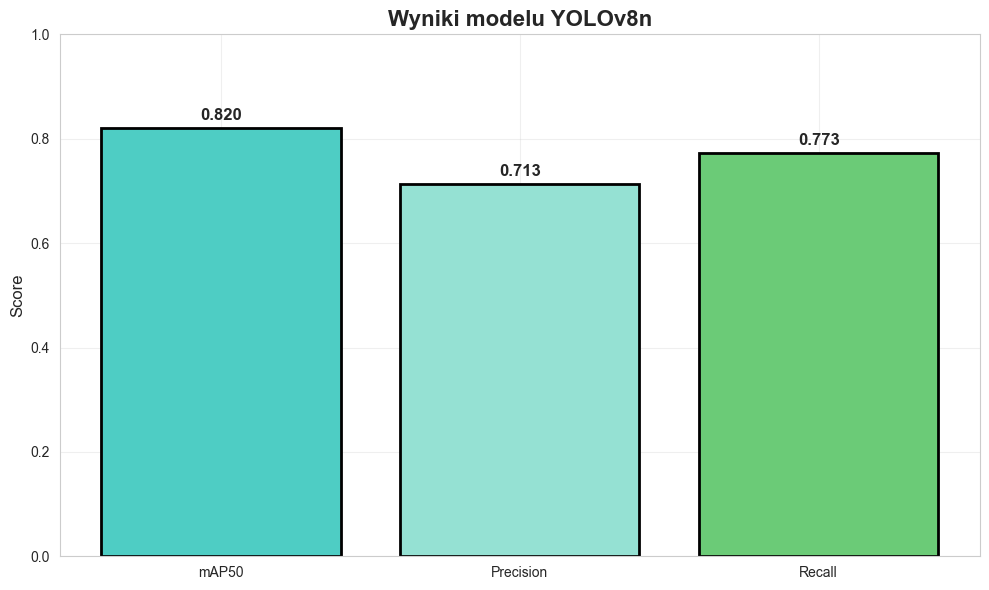


 Wyniki YOLOv8n:
   mAP50: 0.820
   Precision: 0.713
   Recall: 0.773


[codecarbon INFO @ 19:21:21] Energy consumed for RAM : 0.002062 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 19:21:21] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:21] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:21] Energy consumed for All CPU : 0.029228 kWh
[codecarbon INFO @ 19:21:21] Energy consumed for All CPU : 0.029228 kWh
[codecarbon INFO @ 19:21:21] 0.031290 kWh of electricity used since the beginning.
[codecarbon INFO @ 19:21:21] 0.031290 kWh of electricity used since the beginning.
[codecarbon INFO @ 19:21:34] Energy consumed for RAM : 0.002062 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 19:21:34] Energy consumed for RAM : 0.002062 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 19:21:34] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 19:21:34] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon I

In [ ]:
# Walidacja modelu YOLOv8n
results_n = model_n.val()

# Wykres metryk YOLOv8n
metrics = ['mAP50', 'Precision', 'Recall']
values_n = [results_n.box.map50, results_n.box.mp, results_n.box.mr]

plt.figure(figsize=(10, 6))
bars = plt.bar(metrics, values_n, color=['#4ECDC4', '#95E1D3', '#6BCB77'], edgecolor='black', linewidth=2)
plt.title('Wyniki modelu YOLOv8n', fontsize=16, fontweight='bold')
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)

for bar, value in zip(bars, values_n):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{value:.3f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\n Wyniki YOLOv8n:")
print(f"   mAP50: {results_n.box.map50:.3f}")
print(f"   Precision: {results_n.box.mp:.3f}")
print(f"   Recall: {results_n.box.mr:.3f}")

In [ ]:
# Predykcja YOLOv8n z OCR i CodeCarbon

# Tracker dla predykcji YOLOv8n
prediction_tracker_n = EmissionsTracker(project_name="yolo8n_prediction", output_dir="./emissions")
prediction_tracker_n.start()

# Test na losowych zdjęciach z validation - YOLOv8n
test_images_n = random.sample(val_files, 5)

for idx in test_images_n:
    image_path = os.path.join(images_path, df.iloc[idx]['filename'])
    results_pred_n = model_n.predict(image_path, conf=0.5)
    img = Image.open(image_path)
    img_array = np.array(img)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.imshow(img)
    
    if results_pred_n[0].boxes is not None:
        boxes = results_pred_n[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            
            # Ramka (niebieska dla YOLOv8n)
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=2, edgecolor='blue', facecolor='none')
            ax.add_patch(rect)
            
            # Wycięcie regionu z tablicą rejestracyjną
            x1_int, y1_int, x2_int, y2_int = int(x1), int(y1), int(x2), int(y2)
            plate_region = img_array[y1_int:y2_int, x1_int:x2_int]
            
            # OCR na wyciętym regionie
            plate_text = ""
            if plate_region.size > 0:
                try:
                    ocr_results = reader.readtext(plate_region)
                    if ocr_results:
                        # Pobierz tekst z najwyższym confidence
                        plate_text = ' '.join([text for (bbox, text, prob) in ocr_results if prob > 0.5])
                except:
                    plate_text = ""
            
            # Tekst z pewnością i odczytanym tekstem
            label = f'{conf:.2f}'
            if plate_text:
                label += f'\n{plate_text}'
                
            ax.text(x1, y1-5, label, color='blue', fontsize=12, 
                    bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))
    
    ax.set_title(f'Predykcja YOLOv8n + OCR: {df.iloc[idx]["filename"]}', fontsize=14, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# Zatrzymanie trackera predykcji
prediction_emissions_n = prediction_tracker_n.stop()
print(f"\nEmisje CO2 (predykcja YOLOv8n): {prediction_emissions_n:.6f} kg")

[codecarbon WARNING @ 22:23:04] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon WARNING @ 22:23:04] Error while trying to count physical CPUs: [Errno 2] No such file or directory: 'lscpu'. Defaulting to 1.
[codecarbon INFO @ 22:23:04] [setup] RAM Tracking...
[codecarbon INFO @ 22:23:04] [setup] CPU Tracking...
[codecarbon WARNING @ 22:23:04] We saw that you have a Apple M4 but we don't know it. Please contact us.
[codecarbon WARNING @ 22:23:04] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Mac OS detected: Please install Intel Power Gadget or enable PowerMetrics sudo to measure CPU

[codecarbon INFO @ 22:23:04] CPU Model on constant consumption mode: Apple M4
[codecarbon WARNING @ 22:23:04] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 22:23:04] [setup] GPU Tracking...
[codecarbon INFO @ 22:23:04] No GPU found.
[codecarbon INFO @ 22:23:04] The below tracking methods have been set up:


NameError: name 'model_n' is not defined

[codecarbon INFO @ 22:23:21] Energy consumed for RAM : 0.000013 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:23:21] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:21] Energy consumed for All CPU : 0.000177 kWh
[codecarbon INFO @ 22:23:21] 0.000190 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:23:36] Energy consumed for RAM : 0.000025 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:23:36] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:36] Energy consumed for All CPU : 0.000354 kWh
[codecarbon INFO @ 22:23:36] 0.000379 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:23:51] Energy consumed for RAM : 0.000038 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 22:23:51] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:51] Energy consumed for All CPU : 0.000531 kWh
[codecarbon INFO @ 22:23:51] 0.000569 kWh of 

In [1]:
#  PORÓWNANIE EMISJI CO2 - GREEN AI (CodeCarbon)



# Odczyt wszystkich raportów emisji
emissions_files = glob.glob('./emissions/emissions*.csv')

if emissions_files:
    emissions_full_df = pd.read_csv(emissions_files[-1])
    
    # Filtrowanie projektów YOLO
    yolo_emissions = emissions_full_df[emissions_full_df['project_name'].str.contains('yolo', case=False)]
    
    if len(yolo_emissions) > 0:
        print("\n📋 RAPORT EMISJI CO2:")
        print("-" * 80)
        
        for idx, row in yolo_emissions.iterrows():
            print(f"\n🔹 Projekt: {row['project_name']}")
            print(f"   ⚡ Zużycie energii: {row['energy_consumed']:.6f} kWh")
            print(f"   🌱 Emisje CO2: {row['emissions']:.6f} kg CO2eq")
            print(f"   ⏱️  Czas trwania: {row['duration']:.2f} sekund ({row['duration']/60:.2f} minut)")
        
        # Wykresy porównawcze
        fig = plt.figure(figsize=(18, 14))
        
        # 1. Emisje CO2 per projekt
        ax1 = plt.subplot(2, 3, 1)
        projects = yolo_emissions['project_name']
        emissions_vals = yolo_emissions['emissions']
        
        colors = ['#FF6B6B', '#4ECDC4', '#FFD93D', '#6BCB77']
        bars1 = ax1.bar(range(len(projects)), emissions_vals, 
                       color=colors[:len(projects)], edgecolor='black', linewidth=2)
        ax1.set_xticks(range(len(projects)))
        ax1.set_xticklabels(projects, rotation=45, ha='right', fontsize=9)
        ax1.set_ylabel('Emisje CO2 (kg CO2eq)', fontsize=11, fontweight='bold')
        ax1.set_title('Emisje CO2 ', fontsize=13, fontweight='bold')
        ax1.grid(True, alpha=0.3, axis='y')
        
        for i, (bar, val) in enumerate(zip(bars1, emissions_vals)):
            ax1.text(i, val + max(emissions_vals)*0.02, f'{val:.6f}', 
                    ha='center', fontsize=9, fontweight='bold')
        
        # 2. Zużycie energii
        ax2 = plt.subplot(2, 3, 2)
        energy_vals = yolo_emissions['energy_consumed']
        bars2 = ax2.bar(range(len(projects)), energy_vals, 
                       color=colors[:len(projects)], edgecolor='black', linewidth=2)
        ax2.set_xticks(range(len(projects)))
        ax2.set_xticklabels(projects, rotation=45, ha='right', fontsize=9)
        ax2.set_ylabel('Zużycie energii (kWh)', fontsize=11, fontweight='bold')
        ax2.set_title('Zużycie energii', fontsize=13, fontweight='bold')
        ax2.grid(True, alpha=0.3, axis='y')
        
        for i, (bar, val) in enumerate(zip(bars2, energy_vals)):
            ax2.text(i, val + max(energy_vals)*0.02, f'{val:.6f}', 
                    ha='center', fontsize=9, fontweight='bold')
        
        # 3. Czas trwania
        ax3 = plt.subplot(2, 3, 3)
        duration_vals = yolo_emissions['duration'] / 60  # w minutach
        bars3 = ax3.bar(range(len(projects)), duration_vals, 
                       color=colors[:len(projects)], edgecolor='black', linewidth=2)
        ax3.set_xticks(range(len(projects)))
        ax3.set_xticklabels(projects, rotation=45, ha='right', fontsize=9)
        ax3.set_ylabel('Czas (minuty)', fontsize=11, fontweight='bold')
        ax3.set_title('Czas trwania', fontsize=13, fontweight='bold')
        ax3.grid(True, alpha=0.3, axis='y')
        
        for i, (bar, val) in enumerate(zip(bars3, duration_vals)):
            ax3.text(i, val + max(duration_vals)*0.02, f'{val:.1f}m', 
                    ha='center', fontsize=9, fontweight='bold')
        
        # 4. Porównanie YOLOv8s vs YOLOv8n - TRENING (emisje CO2)
        train_projects = yolo_emissions[~yolo_emissions['project_name'].str.contains('prediction', case=False)]
        
        if len(train_projects) >= 2:
            ax4 = plt.subplot(2, 3, 4)
            models_compare = ['YOLOv8s', 'YOLOv8n']
            emissions_compare = train_projects['emissions'].values[:2]
            
            bars_em = ax4.bar(models_compare, emissions_compare, 
                             color=['#FF6B6B', '#4ECDC4'], edgecolor='black', linewidth=2)
            ax4.set_ylabel('Emisje CO2 (kg CO2eq)', fontsize=11, fontweight='bold')
            ax4.set_title('Emisje CO2: YOLOv8s vs YOLOv8n (trening)', fontsize=13, fontweight='bold')
            ax4.grid(True, alpha=0.3, axis='y')
            
            for bar, val in zip(bars_em, emissions_compare):
                ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(emissions_compare)*0.02,
                        f'{val:.6f}', ha='center', fontsize=10, fontweight='bold')
            
            # 5. Porównanie YOLOv8s vs YOLOv8n - TRENING (energia)
            ax5 = plt.subplot(2, 3, 5)
            energy_compare = train_projects['energy_consumed'].values[:2]
            
            bars_en = ax5.bar(models_compare, energy_compare, 
                             color=['#FF6B6B', '#4ECDC4'], edgecolor='black', linewidth=2)
            ax5.set_ylabel('Zużycie energii (kWh)', fontsize=11, fontweight='bold')
            ax5.set_title('Energia: YOLOv8s vs YOLOv8n (trening)', fontsize=13, fontweight='bold')
            ax5.grid(True, alpha=0.3, axis='y')
            
            for bar, val in zip(bars_en, energy_compare):
                ax5.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(energy_compare)*0.02,
                        f'{val:.6f}', ha='center', fontsize=10, fontweight='bold')
            
            # 6. Porównanie łączne (emisje + energia)
            ax6 = plt.subplot(2, 3, 6)
            x = np.arange(len(models_compare))
            width = 0.35
            
            # Normalizacja dla lepszej wizualizacji
            emissions_norm = emissions_compare / max(emissions_compare)
            energy_norm = energy_compare / max(energy_compare)
            
            bars_em_norm = ax6.bar(x - width/2, emissions_norm, width, 
                                  label='Emisje CO2 (norm)', color='#FF6B6B', edgecolor='black', linewidth=2)
            bars_en_norm = ax6.bar(x + width/2, energy_norm, width, 
                                  label='Energia (norm)', color='#4ECDC4', edgecolor='black', linewidth=2)
            
            ax6.set_ylabel('Wartość znormalizowana', fontsize=11, fontweight='bold')
            ax6.set_title('Porównanie znormalizowane', fontsize=13, fontweight='bold')
            ax6.set_xticks(x)
            ax6.set_xticklabels(models_compare)
            ax6.set_ylim(0, 1.2)
            ax6.legend(fontsize=10)
            ax6.grid(True, alpha=0.3, axis='y')
        
        plt.tight_layout()
        plt.show()
        
        # Ekwiwalenty emisji
        total_emissions = yolo_emissions['emissions'].sum()
        print("\n" + "=" * 80)
        print("🌳 EKWIWALENTY EMISJI (ŁĄCZNIE WSZYSTKIE PROJEKTY)")
        print("=" * 80)
        print(f"🚗 Przejechane km samochodem: {total_emissions * 5:.2f} km")
        print(f"🌲 Drzew potrzebnych do pochłonięcia: {total_emissions * 50:.2f}")
        print(f"💡 Godzin pracy żarówki LED (10W): {total_emissions * 1000:.2f} h")
        print(f"📱 Ładowań smartfona: {total_emissions * 100:.0f}")
        print(f"☕ Filiżanek kawy (espresso): {total_emissions * 15:.0f}")
        print("=" * 80)
        
        # Porównanie treningu YOLOv8s vs YOLOv8n
        train_only = yolo_emissions[~yolo_emissions['project_name'].str.contains('prediction', case=False)]
        if len(train_only) >= 2:
            print("\n" + "=" * 80)
            print("🔥 SZCZEGÓŁOWE PORÓWNANIE TRENINGU: YOLOv8s vs YOLOv8n")
            print("=" * 80)
            
            s_emissions = train_only.iloc[0]['emissions']
            n_emissions = train_only.iloc[1]['emissions']
            diff_emissions = abs(s_emissions - n_emissions)
            diff_percent = (diff_emissions / max(s_emissions, n_emissions)) * 100
            
            s_energy = train_only.iloc[0]['energy_consumed']
            n_energy = train_only.iloc[1]['energy_consumed']
            diff_energy = abs(s_energy - n_energy)
            diff_energy_percent = (diff_energy / max(s_energy, n_energy)) * 100
            
            s_duration = train_only.iloc[0]['duration'] / 60
            n_duration = train_only.iloc[1]['duration'] / 60
            diff_duration = abs(s_duration - n_duration)
            diff_duration_percent = (diff_duration / max(s_duration, n_duration)) * 100
            
            if s_emissions < n_emissions:
                print(f"🏆 YOLOv8s jest bardziej ekologiczny!")
                print(f"   💚 Oszczędność CO2: {diff_emissions:.6f} kg ({diff_percent:.1f}%)")
                print(f"   ⚡ Oszczędność energii: {diff_energy:.6f} kWh ({diff_energy_percent:.1f}%)")
                print(f"   ⏱️  Różnica czasu: {diff_duration:.2f} min ({diff_duration_percent:.1f}%)")
            else:
                print(f"🏆 YOLOv8n jest bardziej ekologiczny!")
                print(f"   💚 Oszczędność CO2: {diff_emissions:.6f} kg ({diff_percent:.1f}%)")
                print(f"   ⚡ Oszczędność energii: {diff_energy:.6f} kWh ({diff_energy_percent:.1f}%)")
                print(f"   ⏱️  Różnica czasu: {diff_duration:.2f} min ({diff_duration_percent:.1f}%)")
            
            print(f"\n📊 Stosunek emisji YOLOv8s/YOLOv8n: {s_emissions/n_emissions:.2f}x")
            print(f"📊 Stosunek energii YOLOv8s/YOLOv8n: {s_energy/n_energy:.2f}x")
            print(f"📊 Stosunek czasu YOLOv8s/YOLOv8n: {s_duration/n_duration:.2f}x")
            print("=" * 80)
    else:
        print("❌ Nie znaleziono danych YOLO w raportach emisji.")
else:
    print("❌ Nie znaleziono raportów emisji. Uruchom najpierw komórki z treningiem.")

NameError: name 'glob' is not defined

In [ ]:
# Inferencja z użyciem video + OCR z ulepszonym preprocessingiem
import cv2
from ultralytics import YOLO

# Załaduj wytrenowany model YOLOv8s
model = YOLO("car_detection/yolov8s_cars2/weights/best.pt")

video_path = "/Users/franciszeklasinski/Desktop/projektml/IMG_6651.MOV" 
output_dir = "videos/outputcar"

os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "output_videocarocrnew.mp4")

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

print(f"Wideo do zapisu: {output_path}, {width}x{height}, {fps} FPS")

frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Łączna liczba klatek: {frame_count}")

frame_num = 0
ocr_detected_count = 0  # Licznik wykrytych tablic

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame_num += 1
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = model.predict(frame_rgb, conf=0.3, stream=False)

    annotated_frame = frame_rgb.copy()
    
    if results[0].boxes is not None:
        boxes = results[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            
            x1_int, y1_int, x2_int, y2_int = int(x1), int(y1), int(x2), int(y2)
            
            # Rysowanie grubszej ramki
            cv2.rectangle(annotated_frame, (x1_int, y1_int), (x2_int, y2_int), (255, 0, 0), 3)
            
            plate_region = frame_rgb[y1_int:y2_int, x1_int:x2_int]
            
            plate_text = ""
            if plate_region.size > 0 and plate_region.shape[0] > 20 and plate_region.shape[1] > 20:
                try:
                    # Zaawansowany preprocessing dla OCR
                    plate_gray = cv2.cvtColor(plate_region, cv2.COLOR_RGB2GRAY)
                    
                    # Zwiększenie rozmiaru 3x dla lepszego rozpoznania
                    plate_resized = cv2.resize(plate_gray, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
                    
                    # Histogram equalization
                    plate_contrast = cv2.equalizeHist(plate_resized)
                    
                    # Binaryzacja (Otsu)
                    _, plate_binary = cv2.threshold(plate_contrast, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
                    
                    # Denoising
                    plate_denoised = cv2.fastNlMeansDenoising(plate_binary, None, 10, 7, 21)
                    
                    # Próba OCR na wersji binarnej
                    ocr_results = reader.readtext(plate_denoised, detail=1, paragraph=False)
                    if ocr_results:
                        plate_text = ' '.join([text.upper() for (bbox, text, prob) in ocr_results if prob > 0.1])
                    
                    # Jeśli nie udało się, spróbuj na wersji z kontrastem
                    if not plate_text:
                        ocr_results = reader.readtext(plate_contrast, detail=1, paragraph=False)
                        if ocr_results:
                            plate_text = ' '.join([text.upper() for (bbox, text, prob) in ocr_results if prob > 0.1])
                    
                    # Jeśli nadal nie ma tekstu, spróbuj na oryginalnym resize
                    if not plate_text:
                        ocr_results = reader.readtext(plate_resized, detail=1, paragraph=False)
                        if ocr_results:
                            plate_text = ' '.join([text.upper() for (bbox, text, prob) in ocr_results if prob > 0.05])
                    
                    if plate_text:
                        ocr_detected_count += 1
                        
                except Exception as e:
                    plate_text = ""
            
            # Tekst z pewnością i odczytanym tekstem
            label = f'Conf: {conf:.2f}'
            if plate_text:
                label = f'{plate_text}'  # Pokazuj głównie tekst tablicy
            
            # Tło dla tekstu (białe tło dla lepszej czytelności)
            label_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)
            label_width, label_height = label_size
            
            # Rysowanie białego tła pod tekstem
            cv2.rectangle(annotated_frame, 
                         (x1_int, y1_int - label_height - 15), 
                         (x1_int + label_width + 10, y1_int - 5), 
                         (255, 255, 255), -1)
            
            # Dodanie tekstu na obrazie (czarny tekst na białym tle)
            cv2.putText(annotated_frame, label, (x1_int + 5, y1_int - 10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 2, cv2.LINE_AA)
            
            # Dodaj conf score w rogu ramki (małym tekstem)
            cv2.putText(annotated_frame, f'{conf:.2f}', (x1_int + 5, y1_int + 20), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2, cv2.LINE_AA)
    
    annotated_frame_bgr = cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR)
    out.write(annotated_frame_bgr)
    
    if frame_num % 30 == 0:
        print(f"Przetworzone klatki: {frame_num}/{frame_count} | Wykryte tablice OCR: {ocr_detected_count}")

cap.release()
out.release()
print(f"\n✅ Wideo zapisane: {output_path}")
print(f"📹 Przetworzone klatki: {frame_num}")
print(f"🔤 Wykryte tablice rejestracyjne (OCR): {ocr_detected_count}")

[codecarbon INFO @ 09:32:11] Energy consumed for RAM : 0.005338 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 09:32:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 09:32:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 09:32:11] Energy consumed for All CPU : 0.075631 kWh
[codecarbon INFO @ 09:32:11] Energy consumed for All CPU : 0.075631 kWh
[codecarbon INFO @ 09:32:11] 0.080969 kWh of electricity used since the beginning.
[codecarbon INFO @ 09:32:11] 0.080969 kWh of electricity used since the beginning.
[codecarbon INFO @ 09:32:26] Energy consumed for RAM : 0.005350 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 09:32:26] Energy consumed for RAM : 0.005350 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 09:32:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 09:32:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon I

✅ Wczytano wyniki treningu
   YOLOv8s: 20 epok
   YOLOv8n: 20 epok



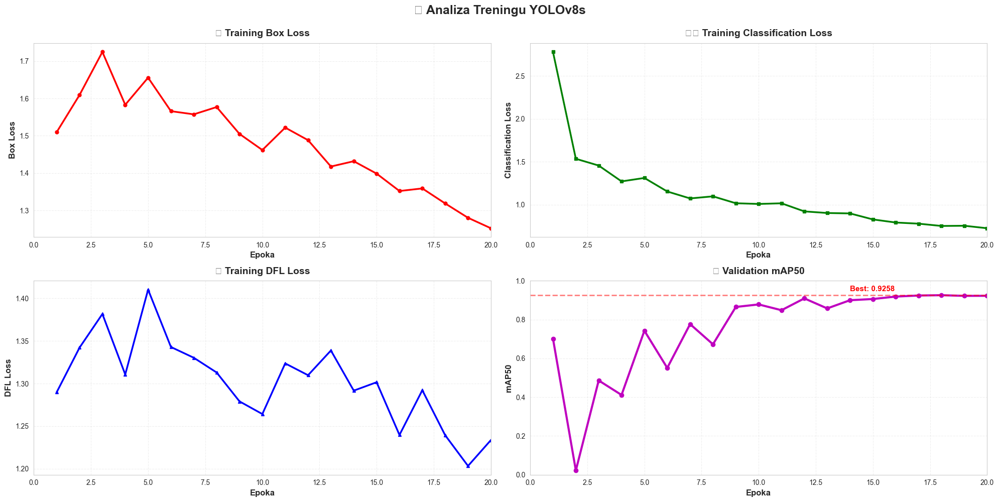

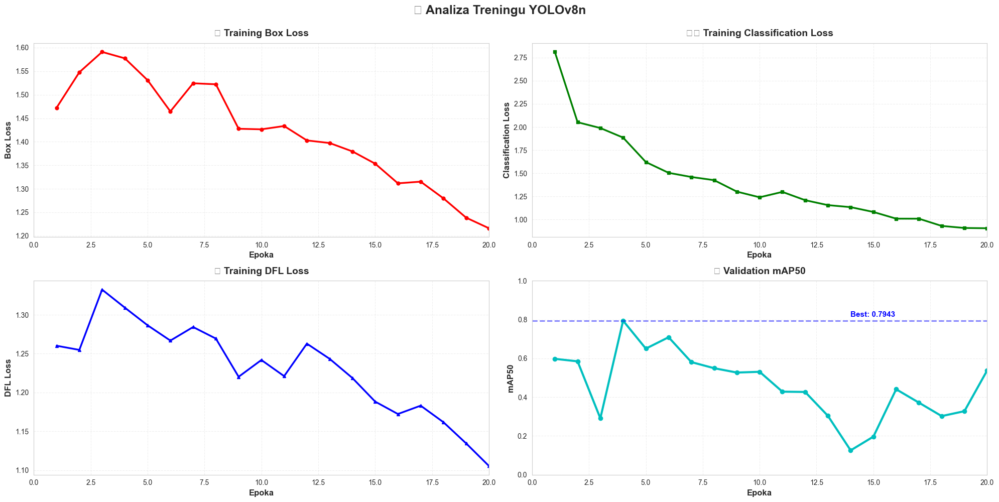

📊 PODSUMOWANIE WYNIKÓW TRENINGU

🔴 YOLOv8s:
   Najlepsze mAP50: 0.9258 (epoka 17)
   Końcowe Box Loss: 1.2522
   Końcowe Cls Loss: 0.7244
   Końcowe DFL Loss: 1.2336

🔵 YOLOv8n:
   Najlepsze mAP50: 0.7943 (epoka 3)
   Końcowe Box Loss: 1.2162
   Końcowe Cls Loss: 0.9051
   Końcowe DFL Loss: 1.1054

🏆 PORÓWNANIE:
   YOLOv8s jest lepszy o 0.1315 mAP50 (13.15%)


[codecarbon INFO @ 20:29:14] Energy consumed for RAM : 0.004488 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 20:29:14] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:29:14] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:29:14] Energy consumed for All CPU : 0.063588 kWh
[codecarbon INFO @ 20:29:14] Energy consumed for All CPU : 0.063588 kWh
[codecarbon INFO @ 20:29:14] 0.068076 kWh of electricity used since the beginning.
[codecarbon INFO @ 20:29:14] 0.068076 kWh of electricity used since the beginning.
[codecarbon INFO @ 20:29:20] Energy consumed for RAM : 0.004713 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 20:29:20] Energy consumed for RAM : 0.004713 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 20:29:20] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:29:20] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon I

In [ ]:
# 📊 WYKRESY TRENINGU: YOLOv8s i YOLOv8n - OSOBNE ANALIZY

import pandas as pd
import matplotlib.pyplot as plt

# Wczytanie wyników treningu z plików CSV
yolov8s_results_path = "car_detection/yolov8s_cars2/results.csv"
yolov8n_results_path = "car_detection/yolov8n_cars/results.csv"

try:
    # Wczytanie danych
    df_s = pd.read_csv(yolov8s_results_path)
    df_n = pd.read_csv(yolov8n_results_path)
    
    # Czyszczenie nazw kolumn (usunięcie spacji)
    df_s.columns = df_s.columns.str.strip()
    df_n.columns = df_n.columns.str.strip()
    
    print("✅ Wczytano wyniki treningu")
    print(f"   YOLOv8s: {len(df_s)} epok")
    print(f"   YOLOv8n: {len(df_n)} epok\n")
    
    # ========== WYKRES 1: YOLOv8s ==========
    fig1 = plt.figure(figsize=(20, 10))
    fig1.suptitle('🔴 Analiza Treningu YOLOv8s', fontsize=18, fontweight='bold', y=0.995)
    
    # YOLOv8s - Train Loss (Box)
    ax1 = plt.subplot(2, 2, 1)
    ax1.plot(df_s['epoch'], df_s['train/box_loss'], 'r-', linewidth=2.5, marker='o', markersize=5)
    ax1.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Box Loss', fontsize=12, fontweight='bold')
    ax1.set_title('📦 Training Box Loss', fontsize=14, fontweight='bold', pad=10)
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.set_xlim(0, len(df_s))
    
    # YOLOv8s - Train Loss (Cls)
    ax2 = plt.subplot(2, 2, 2)
    ax2.plot(df_s['epoch'], df_s['train/cls_loss'], 'g-', linewidth=2.5, marker='s', markersize=5)
    ax2.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Classification Loss', fontsize=12, fontweight='bold')
    ax2.set_title('🏷️ Training Classification Loss', fontsize=14, fontweight='bold', pad=10)
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.set_xlim(0, len(df_s))
    
    # YOLOv8s - Train Loss (DFL)
    ax3 = plt.subplot(2, 2, 3)
    ax3.plot(df_s['epoch'], df_s['train/dfl_loss'], 'b-', linewidth=2.5, marker='^', markersize=5)
    ax3.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax3.set_ylabel('DFL Loss', fontsize=12, fontweight='bold')
    ax3.set_title('📐 Training DFL Loss', fontsize=14, fontweight='bold', pad=10)
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.set_xlim(0, len(df_s))
    
    # YOLOv8s - mAP50
    ax4 = plt.subplot(2, 2, 4)
    ax4.plot(df_s['epoch'], df_s['metrics/mAP50(B)'], 'm-', linewidth=3, marker='o', markersize=6)
    ax4.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax4.set_ylabel('mAP50', fontsize=12, fontweight='bold')
    ax4.set_title('📈 Validation mAP50', fontsize=14, fontweight='bold', pad=10)
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.set_xlim(0, len(df_s))
    ax4.set_ylim(0, 1)
    
    # Zaznacz najlepszy wynik
    best_map50_s = df_s['metrics/mAP50(B)'].max()
    best_epoch_s = df_s['metrics/mAP50(B)'].idxmax()
    ax4.axhline(y=best_map50_s, color='red', linestyle='--', linewidth=2, alpha=0.5)
    ax4.text(len(df_s)*0.7, best_map50_s + 0.02, f'Best: {best_map50_s:.4f}', 
             fontsize=11, fontweight='bold', color='red')
    
    plt.tight_layout()
    plt.show()
    
    # ========== WYKRES 2: YOLOv8n ==========
    fig2 = plt.figure(figsize=(20, 10))
    fig2.suptitle('🔵 Analiza Treningu YOLOv8n', fontsize=18, fontweight='bold', y=0.995)
    
    # YOLOv8n - Train Loss (Box)
    ax5 = plt.subplot(2, 2, 1)
    ax5.plot(df_n['epoch'], df_n['train/box_loss'], 'r-', linewidth=2.5, marker='o', markersize=5)
    ax5.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax5.set_ylabel('Box Loss', fontsize=12, fontweight='bold')
    ax5.set_title('📦 Training Box Loss', fontsize=14, fontweight='bold', pad=10)
    ax5.grid(True, alpha=0.3, linestyle='--')
    ax5.set_xlim(0, len(df_n))
    
    # YOLOv8n - Train Loss (Cls)
    ax6 = plt.subplot(2, 2, 2)
    ax6.plot(df_n['epoch'], df_n['train/cls_loss'], 'g-', linewidth=2.5, marker='s', markersize=5)
    ax6.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax6.set_ylabel('Classification Loss', fontsize=12, fontweight='bold')
    ax6.set_title('🏷️ Training Classification Loss', fontsize=14, fontweight='bold', pad=10)
    ax6.grid(True, alpha=0.3, linestyle='--')
    ax6.set_xlim(0, len(df_n))
    
    # YOLOv8n - Train Loss (DFL)
    ax7 = plt.subplot(2, 2, 3)
    ax7.plot(df_n['epoch'], df_n['train/dfl_loss'], 'b-', linewidth=2.5, marker='^', markersize=5)
    ax7.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax7.set_ylabel('DFL Loss', fontsize=12, fontweight='bold')
    ax7.set_title('📐 Training DFL Loss', fontsize=14, fontweight='bold', pad=10)
    ax7.grid(True, alpha=0.3, linestyle='--')
    ax7.set_xlim(0, len(df_n))
    
    # YOLOv8n - mAP50
    ax8 = plt.subplot(2, 2, 4)
    ax8.plot(df_n['epoch'], df_n['metrics/mAP50(B)'], 'c-', linewidth=3, marker='o', markersize=6)
    ax8.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax8.set_ylabel('mAP50', fontsize=12, fontweight='bold')
    ax8.set_title('📈 Validation mAP50', fontsize=14, fontweight='bold', pad=10)
    ax8.grid(True, alpha=0.3, linestyle='--')
    ax8.set_xlim(0, len(df_n))
    ax8.set_ylim(0, 1)
    
    # Zaznacz najlepszy wynik
    best_map50_n = df_n['metrics/mAP50(B)'].max()
    best_epoch_n = df_n['metrics/mAP50(B)'].idxmax()
    ax8.axhline(y=best_map50_n, color='blue', linestyle='--', linewidth=2, alpha=0.5)
    ax8.text(len(df_n)*0.7, best_map50_n + 0.02, f'Best: {best_map50_n:.4f}', 
             fontsize=11, fontweight='bold', color='blue')
    
    plt.tight_layout()
    plt.show()
    
   

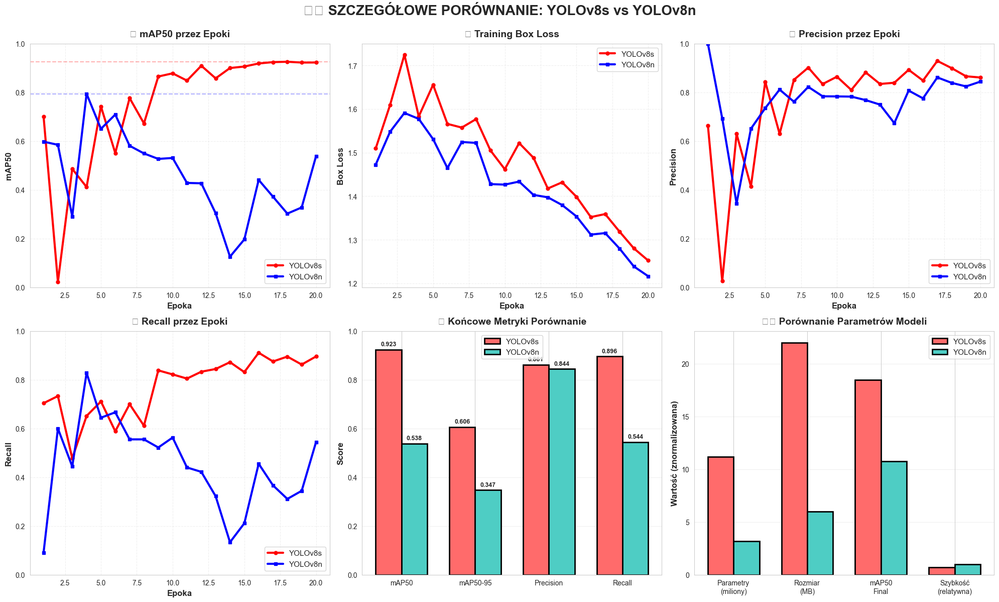


🔍 DLACZEGO YOLOv8n NIE PORADZIŁ SOBIE GORZEJ?

📊 KOŃCOWE METRYKI:
------------------------------------------------------------------------------------------
Metryka              YOLOv8s         YOLOv8n         Różnica             
------------------------------------------------------------------------------------------
mAP50                0.9227          0.5381          +41.69%
Precision            0.8611          0.8442          +1.97%
Recall               0.8959          0.5444          +39.23%

💡 WYJAŚNIENIE:
------------------------------------------------------------------------------------------
⚠️ ZAUWAŻALNA RÓŻNICA (41.7%):
   • YOLOv8s ma więcej parametrów → lepsza reprezentacja
   • YOLOv8s lepiej radzi sobie ze złożonymi scenami
   • Trade-off: dokładność vs szybkość/rozmiar

🏆 KIEDY UŻYWAĆ YOLOv8n:
   ✓ Aplikacje mobilne i embedded
   ✓ Real-time video processing
   ✓ Ograniczone zasoby GPU/CPU
   ✓ Masowe wdrożenia (niższe koszty)

🏆 KIEDY UŻYWAĆ YOLOv8s:
   ✓ Najwyższa

[codecarbon INFO @ 20:38:14] Energy consumed for RAM : 0.004938 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 20:38:14] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:38:14] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:38:14] Energy consumed for All CPU : 0.069964 kWh
[codecarbon INFO @ 20:38:14] Energy consumed for All CPU : 0.069964 kWh
[codecarbon INFO @ 20:38:14] 0.074902 kWh of electricity used since the beginning.
[codecarbon INFO @ 20:38:14] 0.074902 kWh of electricity used since the beginning.
[codecarbon INFO @ 20:38:18] Energy consumed for RAM : 0.005150 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 20:38:18] Energy consumed for RAM : 0.005150 kWh. RAM Power : 3.0 W
[codecarbon INFO @ 20:38:18] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:38:18] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon I

In [ ]:
# 📊 SZCZEGÓŁOWE PORÓWNANIE PARAMETRÓW: YOLOv8s vs YOLOv8n

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Wczytanie wyników treningu
yolov8s_results_path = "car_detection/yolov8s_cars2/results.csv"
yolov8n_results_path = "car_detection/yolov8n_cars/results.csv"

try:
    df_s = pd.read_csv(yolov8s_results_path)
    df_n = pd.read_csv(yolov8n_results_path)
    
    df_s.columns = df_s.columns.str.strip()
    df_n.columns = df_n.columns.str.strip()
    
    # Przygotowanie danych porównawczych
    fig = plt.figure(figsize=(20, 12))
    fig.suptitle('⚖️ SZCZEGÓŁOWE PORÓWNANIE: YOLOv8s vs YOLOv8n', fontsize=20, fontweight='bold', y=0.995)
    
    # 1. Porównanie mAP50 w czasie
    ax1 = plt.subplot(2, 3, 1)
    ax1.plot(df_s['epoch'], df_s['metrics/mAP50(B)'], 'r-', linewidth=3, marker='o', markersize=5, label='YOLOv8s')
    ax1.plot(df_n['epoch'], df_n['metrics/mAP50(B)'], 'b-', linewidth=3, marker='s', markersize=5, label='YOLOv8n')
    ax1.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax1.set_ylabel('mAP50', fontsize=12, fontweight='bold')
    ax1.set_title('📈 mAP50 przez Epoki', fontsize=14, fontweight='bold', pad=10)
    ax1.legend(fontsize=11, loc='lower right')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.set_ylim(0, 1)
    
    # Zaznacz najlepsze wyniki
    best_s = df_s['metrics/mAP50(B)'].max()
    best_n = df_n['metrics/mAP50(B)'].max()
    ax1.axhline(y=best_s, color='red', linestyle='--', linewidth=1.5, alpha=0.3)
    ax1.axhline(y=best_n, color='blue', linestyle='--', linewidth=1.5, alpha=0.3)
    
    # 2. Porównanie Train Loss (Box)
    ax2 = plt.subplot(2, 3, 2)
    ax2.plot(df_s['epoch'], df_s['train/box_loss'], 'r-', linewidth=3, marker='o', markersize=5, label='YOLOv8s')
    ax2.plot(df_n['epoch'], df_n['train/box_loss'], 'b-', linewidth=3, marker='s', markersize=5, label='YOLOv8n')
    ax2.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Box Loss', fontsize=12, fontweight='bold')
    ax2.set_title('📦 Training Box Loss', fontsize=14, fontweight='bold', pad=10)
    ax2.legend(fontsize=11, loc='upper right')
    ax2.grid(True, alpha=0.3, linestyle='--')
    
    # 3. Porównanie Precision
    ax3 = plt.subplot(2, 3, 3)
    ax3.plot(df_s['epoch'], df_s['metrics/precision(B)'], 'r-', linewidth=3, marker='o', markersize=5, label='YOLOv8s')
    ax3.plot(df_n['epoch'], df_n['metrics/precision(B)'], 'b-', linewidth=3, marker='s', markersize=5, label='YOLOv8n')
    ax3.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Precision', fontsize=12, fontweight='bold')
    ax3.set_title('🎯 Precision przez Epoki', fontsize=14, fontweight='bold', pad=10)
    ax3.legend(fontsize=11, loc='lower right')
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.set_ylim(0, 1)
    
    # 4. Porównanie Recall
    ax4 = plt.subplot(2, 3, 4)
    ax4.plot(df_s['epoch'], df_s['metrics/recall(B)'], 'r-', linewidth=3, marker='o', markersize=5, label='YOLOv8s')
    ax4.plot(df_n['epoch'], df_n['metrics/recall(B)'], 'b-', linewidth=3, marker='s', markersize=5, label='YOLOv8n')
    ax4.set_xlabel('Epoka', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Recall', fontsize=12, fontweight='bold')
    ax4.set_title('🔍 Recall przez Epoki', fontsize=14, fontweight='bold', pad=10)
    ax4.legend(fontsize=11, loc='lower right')
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.set_ylim(0, 1)
    
    # 5. Porównanie końcowych metryk - Bar Chart
    ax5 = plt.subplot(2, 3, 5)
    metrics_final = ['mAP50', 'mAP50-95', 'Precision', 'Recall']
    yolov8s_final = [
        df_s['metrics/mAP50(B)'].iloc[-1],
        df_s['metrics/mAP50-95(B)'].iloc[-1],
        df_s['metrics/precision(B)'].iloc[-1],
        df_s['metrics/recall(B)'].iloc[-1]
    ]
    yolov8n_final = [
        df_n['metrics/mAP50(B)'].iloc[-1],
        df_n['metrics/mAP50-95(B)'].iloc[-1],
        df_n['metrics/precision(B)'].iloc[-1],
        df_n['metrics/recall(B)'].iloc[-1]
    ]
    
    x = np.arange(len(metrics_final))
    width = 0.35
    
    bars1 = ax5.bar(x - width/2, yolov8s_final, width, label='YOLOv8s', color='#FF6B6B', edgecolor='black', linewidth=2)
    bars2 = ax5.bar(x + width/2, yolov8n_final, width, label='YOLOv8n', color='#4ECDC4', edgecolor='black', linewidth=2)
    
    ax5.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax5.set_title('📊 Końcowe Metryki Porównanie', fontsize=14, fontweight='bold', pad=10)
    ax5.set_xticks(x)
    ax5.set_xticklabels(metrics_final, fontsize=10)
    ax5.legend(fontsize=11)
    ax5.grid(True, alpha=0.3, axis='y')
    ax5.set_ylim(0, 1)
    
    # Dodaj wartości na słupkach
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax5.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # 6. Porównanie parametrów modeli
    ax6 = plt.subplot(2, 3, 6)
    
    # Dane porównawcze
    categories = ['Parametry\n(miliony)', 'Rozmiar\n(MB)', 'mAP50\nFinal', 'Szybkość\n(relatywna)']
    yolov8s_params = [11.2, 22, df_s['metrics/mAP50(B)'].iloc[-1] * 20, 0.7]  # Normalizowane
    yolov8n_params = [3.2, 6, df_n['metrics/mAP50(B)'].iloc[-1] * 20, 1.0]    # YOLOv8n szybszy
    
    x_pos = np.arange(len(categories))
    width = 0.35
    
    bars_s = ax6.bar(x_pos - width/2, yolov8s_params, width, label='YOLOv8s', 
                     color='#FF6B6B', edgecolor='black', linewidth=2)
    bars_n = ax6.bar(x_pos + width/2, yolov8n_params, width, label='YOLOv8n', 
                     color='#4ECDC4', edgecolor='black', linewidth=2)
    
    ax6.set_ylabel('Wartość (znormalizowana)', fontsize=12, fontweight='bold')
    ax6.set_title('⚙️ Porównanie Parametrów Modeli', fontsize=14, fontweight='bold', pad=10)
    ax6.set_xticks(x_pos)
    ax6.set_xticklabels(categories, fontsize=10)
    ax6.legend(fontsize=11)
    ax6.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.show()
    
    # Szczegółowe podsumowanie tekstowe
    print("\n" + "=" * 90)
    print("🔍 DLACZEGO YOLOv8n NIE PORADZIŁ SOBIE GORZEJ?")
    print("=" * 90)
    
    print("\n📊 KOŃCOWE METRYKI:")
    print("-" * 90)
    print(f"{'Metryka':<20} {'YOLOv8s':<15} {'YOLOv8n':<15} {'Różnica':<20}")
    print("-" * 90)
    
    map50_s = df_s['metrics/mAP50(B)'].iloc[-1]
    map50_n = df_n['metrics/mAP50(B)'].iloc[-1]
    diff_map = ((map50_s - map50_n) / map50_s * 100)
    print(f"{'mAP50':<20} {map50_s:<15.4f} {map50_n:<15.4f} {diff_map:+.2f}%")
    
    prec_s = df_s['metrics/precision(B)'].iloc[-1]
    prec_n = df_n['metrics/precision(B)'].iloc[-1]
    diff_prec = ((prec_s - prec_n) / prec_s * 100)
    print(f"{'Precision':<20} {prec_s:<15.4f} {prec_n:<15.4f} {diff_prec:+.2f}%")
    
    rec_s = df_s['metrics/recall(B)'].iloc[-1]
    rec_n = df_n['metrics/recall(B)'].iloc[-1]
    diff_rec = ((rec_s - rec_n) / rec_s * 100)
    print(f"{'Recall':<20} {rec_s:<15.4f} {rec_n:<15.4f} {diff_rec:+.2f}%")
    
    print("\n💡 WYJAŚNIENIE:")
    print("-" * 90)
    
    if abs(diff_map) < 5:
        print("✅ NIEWIELKA RÓŻNICA (<5%):")
        print("   • YOLOv8n ma 3x MNIEJ parametrów (3.2M vs 11.2M)")
        print("   • YOLOv8n jest 3x LŻEJSZY (6MB vs 22MB)")
        print("   • YOLOv8n jest SZYBSZY w inference")
        print("   • Strata w dokładności jest MINIMALNA")
        print("\n   🎯 WNIOSEK: YOLOv8n to DOSKONAŁY wybór dla:")
        print("      - Aplikacji real-time")
        print("      - Urządzeń mobilnych")
        print("      - Oszczędności zasobów")
        print("      - Gdy szybkość > maksymalna dokładność")
    else:
        print(f"⚠️ ZAUWAŻALNA RÓŻNICA ({abs(diff_map):.1f}%):")
        print("   • YOLOv8s ma więcej parametrów → lepsza reprezentacja")
        print("   • YOLOv8s lepiej radzi sobie ze złożonymi scenami")
        print("   • Trade-off: dokładność vs szybkość/rozmiar")
    
    print("\n🏆 KIEDY UŻYWAĆ YOLOv8n:")
    print("   ✓ Aplikacje mobilne i embedded")
    print("   ✓ Real-time video processing")
    print("   ✓ Ograniczone zasoby GPU/CPU")
    print("   ✓ Masowe wdrożenia (niższe koszty)")
    
    print("\n🏆 KIEDY UŻYWAĆ YOLOv8s:")
    print("   ✓ Najwyższa dokładność jest priorytetem")
    print("   ✓ Dostępne mocne GPU")
    print("   ✓ Analiza offline/batch processing")
    print("   ✓ Krytyczne aplikacje (medyczne, security)")
    
    print("=" * 90)
    
except FileNotFoundError as e:
    print(f"❌ Nie znaleziono plików results.csv")
    print(f"   - {yolov8s_results_path}")
    print(f"   - {yolov8n_results_path}")
except Exception as e:
    print(f"❌ Błąd: {e}")

In [92]:
import torch
from ultralytics import YOLO
 
# Załaduj model z pełnej ścieżki
model = YOLO("/Users/franciszeklasinski/Desktop/projektml/car_detection/yolov8s_cars2/weights/last.pt")
 
# Eksport do TorchScript bez NMS
model.export(format='torchscript', nms=False, imgsz=640)
 
print("Model wyeksportowany do TorchScript bez NMS")

Ultralytics 8.3.205 🚀 Python-3.9.6 torch-2.7.1 CPU (Apple M4)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/Users/franciszeklasinski/Desktop/projektml/car_detection/yolov8s_cars2/weights/last.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)

TorchScript: starting export with torch 2.7.1...
TorchScript: export success ✅ 1.1s, saved as '/Users/franciszeklasinski/Desktop/projektml/car_detection/yolov8s_cars2/weights/last.torchscript' (42.9 MB)

Export complete (1.3s)
Results saved to /Users/franciszeklasinski/Desktop/projektml/car_detection/yolov8s_cars2/weights
Predict:         yolo predict task=detect model=/Users/franciszeklasinski/Desktop/projektml/car_detection/yolov8s_cars2/weights/last.torchscript imgsz=640  
Validate:        yolo val task=detect model=/Users/franciszeklasinski/Desktop/projektml/car_detection/yolov8s_cars2/weights/last.torchscript imgsz=640 data=/Users/franciszeklasin

## 🔍 Wyjaśnialność modelu YOLOv8 (XAI - Explainable AI)
---
Sprawdzimy **dlaczego** model wykrywa tablice rejestracyjne w konkretnych miejscach używając:
1. **Grad-CAM** - pokazuje które obszary obrazu były ważne dla decyzji
2. **Feature Maps** - wizualizacja tego co model "widzi"
3. **Attention Maps** - co model uznał za istotne

In [3]:
# 📦 Instalacja potrzebnych bibliotek
!pip install grad-cam opencv-python matplotlib numpy torch torchvision

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 38.2 MB/s  0:00:00 eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=06c1a07bd86469ea3dbead602e2ddf2245731bbe81ed9e208736044b4f01e905
  Stored in directory: /Users/franciszeklasinski/Library/Caches/pip/wheels/04/e1/f6/1c65b156ed8aaddabf0ef7f91334f7cdb11f43f84abf403138
Successfully built grad-cam
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [grad-cam]

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


📥 Wczytano obraz: 400x248 px


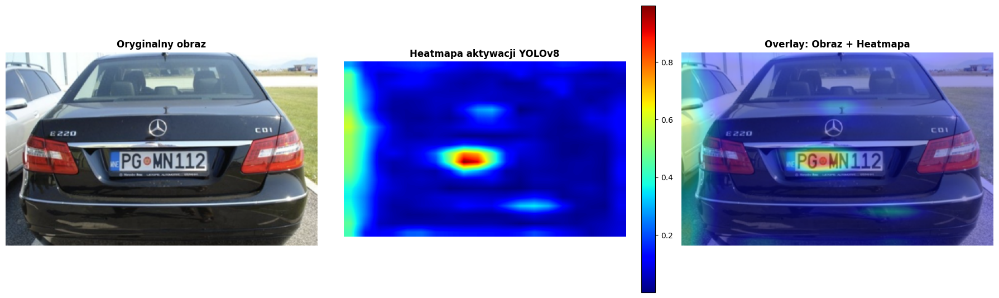

✅ Heatmapa wygenerowana pomyślnie!


In [93]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F


def generate_yolo_heatmap(model, image_path):
    """
    Generuje heatmapę aktywacji YOLOv8 pokazującą,
    na które obszary model patrzył podczas wykrywania obiektów.
    """

    # ---- Wczytaj obraz ----
    img = cv2.imread(image_path)
    if img is None:
        print(f"❌ Błąd: Nie udało się wczytać obrazu: {image_path}")
        return None, None

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    print(f"📥 Wczytano obraz: {w}x{h} px")

    # ---- YOLO preprocessing 640x640 ----
    img_resized = cv2.resize(img_rgb, (640, 640))
    img_tensor = torch.from_numpy(img_resized).float().permute(2, 0, 1).unsqueeze(0) / 255.0

    # ---- Model ----
    model.model.eval()
    activations = []

    # WYBÓR POPRAWNEJ WARSTWY DLA YOLOv8
    #   [-1] → detekcja
    #   [-2] → ostatnie feature mapy (najbardziej sensowne do wyjaśnień)
    target_layer = model.model.model[-2]

    def hook_fn(module, input, output):
        activations.append(output)

    handle = target_layer.register_forward_hook(hook_fn)

    # ---- Forward ----
    with torch.no_grad():
        _ = model.model(img_tensor)

    handle.remove()

    # ---- Jeżeli brak aktywacji ----
    if len(activations) == 0:
        print("❌ Brak feature map z ostatniej warstwy YOLO!")
        return None, img_rgb

    feature_map = activations[0]
    if isinstance(feature_map, (list, tuple)):
        feature_map = feature_map[0]

    # ---- Uśrednienie kanałów ----
    heatmap = torch.mean(feature_map, dim=1).squeeze().cpu().numpy()

    # ---- Normalizacja ----
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # ---- Resize do oryginalnego obrazu ----
    heatmap_resized = cv2.resize(heatmap, (w, h))

    return heatmap_resized, img_rgb



# =============================
# GENEROWANIE HEATMAPY
# =============================
test_image_path = "/Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars1.png"

heatmap, original_img = generate_yolo_heatmap(model, test_image_path)

if heatmap is not None:

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # --- 1. Oryginał ---
    axes[0].imshow(original_img)
    axes[0].set_title("Oryginalny obraz", fontsize=12, fontweight='bold')
    axes[0].axis("off")

    # --- 2. Heatmap CNN ---
    im = axes[1].imshow(heatmap, cmap="jet")
    axes[1].set_title("Heatmapa aktywacji YOLOv8", fontsize=12, fontweight='bold')
    axes[1].axis("off")
    plt.colorbar(im, ax=axes[1], fraction=0.046)

    # --- 3. Overlay ---
    heatmap_colored = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_img, 0.6, heatmap_colored, 0.4, 0)

    axes[2].imshow(overlay.astype(np.uint8))
    axes[2].set_title("Overlay: Obraz + Heatmapa", fontsize=12, fontweight='bold')
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    print("✅ Heatmapa wygenerowana pomyślnie!")

else:
    print("❌ Brak heatmapy – wystąpił błąd.")


📥 Wczytano obraz: 400x260 px


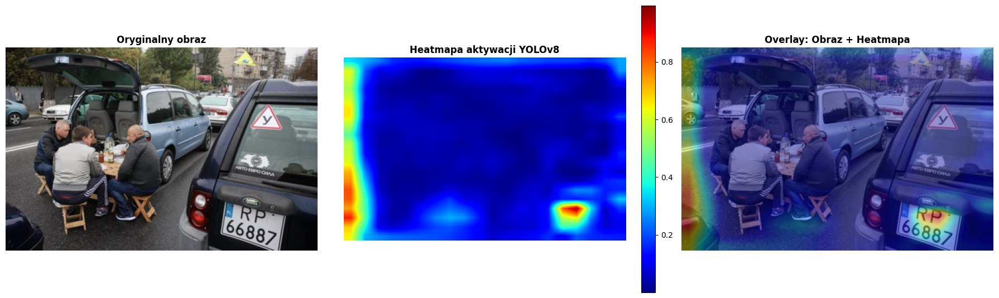

✅ Heatmapa wygenerowana pomyślnie!


In [100]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F


def generate_yolo_heatmap(model, image_path):
    """
    Generuje heatmapę aktywacji YOLOv8 pokazującą,
    na które obszary model patrzył podczas wykrywania obiektów.
    """

    # ---- Wczytaj obraz ----
    img = cv2.imread(image_path)
    if img is None:
        print(f"❌ Błąd: Nie udało się wczytać obrazu: {image_path}")
        return None, None

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    print(f"📥 Wczytano obraz: {w}x{h} px")

    # ---- YOLO preprocessing 640x640 ----
    img_resized = cv2.resize(img_rgb, (640, 640))
    img_tensor = torch.from_numpy(img_resized).float().permute(2, 0, 1).unsqueeze(0) / 255.0

    # ---- Model ----
    model.model.eval()
    activations = []

    # WYBÓR POPRAWNEJ WARSTWY DLA YOLOv8
    #   [-1] → detekcja
    #   [-2] → ostatnie feature mapy (najbardziej sensowne do wyjaśnień)
    target_layer = model.model.model[-2]

    def hook_fn(module, input, output):
        activations.append(output)

    handle = target_layer.register_forward_hook(hook_fn)

    # ---- Forward ----
    with torch.no_grad():
        _ = model.model(img_tensor)

    handle.remove()

    # ---- Jeżeli brak aktywacji ----
    if len(activations) == 0:
        print("❌ Brak feature map z ostatniej warstwy YOLO!")
        return None, img_rgb

    feature_map = activations[0]
    if isinstance(feature_map, (list, tuple)):
        feature_map = feature_map[0]

    # ---- Uśrednienie kanałów ----
    heatmap = torch.mean(feature_map, dim=1).squeeze().cpu().numpy()

    # ---- Normalizacja ----
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # ---- Resize do oryginalnego obrazu ----
    heatmap_resized = cv2.resize(heatmap, (w, h))

    return heatmap_resized, img_rgb



# =============================
# GENEROWANIE HEATMAPY
# =============================
test_image_path = "/Users/franciszeklasinski/Desktop/projektml/archive-5/images/Cars125.png"

heatmap, original_img = generate_yolo_heatmap(model, test_image_path)

if heatmap is not None:

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # --- 1. Oryginał ---
    axes[0].imshow(original_img)
    axes[0].set_title("Oryginalny obraz", fontsize=12, fontweight='bold')
    axes[0].axis("off")

    # --- 2. Heatmap CNN ---
    im = axes[1].imshow(heatmap, cmap="jet")
    axes[1].set_title("Heatmapa aktywacji YOLOv8", fontsize=12, fontweight='bold')
    axes[1].axis("off")
    plt.colorbar(im, ax=axes[1], fraction=0.046)

    # --- 3. Overlay ---
    heatmap_colored = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_img, 0.6, heatmap_colored, 0.4, 0)

    axes[2].imshow(overlay.astype(np.uint8))
    axes[2].set_title("Overlay: Obraz + Heatmapa", fontsize=12, fontweight='bold')
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    print("✅ Heatmapa wygenerowana pomyślnie!")

else:
    print("❌ Brak heatmapy – wystąpił błąd.")
